# The Neural Dynamics of Valence and Intensity Encoding in the Amygdala and Prefrontal Cortex

**Authors:** Rahim Hashim, Roberto Gulli, Stefano Fusi, Daniel Salzman <br>
**Notebook Owner:** Rahim Hashim (rh2898@columbia.edu) <br>
***

## Import Libraries and Setting Path Variables

Make sure that all the libraries specified in environment.yaml are installed (see [pip](https://packaging.python.org/en/latest/tutorials/installing-packages/) documentation for more info). 

**~The structure of the directory should be:~**
```
ROOT
│
└─data
│  │
│  └─raw
│  |  │   
│  │  └─data_<TASK>
│  │  │   
│  │  └─<MONKEY>_<YYYYMMDD>_g<d>             
│  │     │    
│  │     └─<MONKEY>_<YYYYMMDD>_g<d>_t<d>.meta
│  │     │    
│  │     └─<MONKEY>_<YYYYMMDD>_g<d>_t<d>.bin   
│  │ 
│  └─processed
│  │  │   
│  │  └─data_<TASK>
│  │ 
│  └─_fractals
│     │   
│     └─<YYYYMMDD>
│
└─tasks
  │
  └─<EXPERIMENT>
	  │   
	  └─<TASK>  
		  │   
		  └─<videos>     

```

**MACBOOK:**
> **Raw Data Source:** `/Users/rahimhashim/Google Drive/My Drive/Columbia/Salzman/Monkey-Training/tasks/rhAirpuff/8. Probabilistic_Reward_Airpuff_Choice` <br>
> **Raw Data Target:** '/Users/rahimhashim/Google Drive/My Drive/Columbia/Salzman/Monkey-Training/data/raw/data_Probabilistic_Reward_Airpuff_Choice'

**PC:**
> **Raw Data Source:** `/Users/rahimhashim/Google Drive/My Drive/Columbia/Salzman/Monkey-Training/tasks/rhAirpuff/8. Probabilistic_Reward_Airpuff_Choice` <br>
> **Raw Data Target:** '/Users/rahimhashim/Google Drive/My Drive/Columbia/Salzman/Monkey-Training/data/raw/data_Probabilistic_Reward_Airpuff_Choice'

In [ ]:
# Move files from acquisition computer to Google Drive
# !bash utilities/move_files.sh Aragorn 240521
!bash utilities/move_files.sh Aragorn 241010

In [2]:
%load_ext autoreload
%autoreload 2
import os
import re
import sys
import cv2
import numpy as np
import pandas as pd
from PIL import Image
from pprint import pprint
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
from collections import defaultdict

# Custom classes
from classes.Session_Path import SessionPath
from classes.Session import Session
# pandas options
pd.options.mode.chained_assignment = None  # default='warn'
pd.set_option('display.max_columns', None)

# See tree branch above to set <ROOT>, <EXPERIMENT>
ROOT = '/Users/rahimhashim/Google Drive/My Drive/Columbia/Salzman/Monkey-Training/'
EXPERIMENT = 'rhAirpuff'
TASK = 'Probabilistic_Reward_Airpuff_Generalization' 

path_obj = SessionPath(ROOT, EXPERIMENT, TASK)

Raw Data Path Exists: /Users/rahimhashim/Google Drive/My Drive/Columbia/Salzman/Monkey-Training/data/raw/data_Probabilistic_Reward_Airpuff_Generalization
  Number of Total Files  : 88
  Monkey: Bear
    Number of Bear Files : 14
    Earliest Date    : 240207
    Most Recent Date : 241119
  Monkey: Aragorn
    Number of Aragorn Files : 72
    Earliest Date    : 230525
    Most Recent Date : 241223
No video folder found for task: Probabilistic_Reward_Airpuff_Generalization
Pulling '.h5' files...
  Complete: 86 '.h5' files pulled


***
## Specifying Session and Analyses Parameters
Choose the date(s) and monkey(s) that you'd like to include in your analysis. 
> `reprocess_data` <br>
> * `True` : generates (or regenerates) the session_df DataFrame from `data/raw` data <br>
> * `False` : loads the pickled session_df DataFrame from the `data/processed` data directory

> `save_df` <br>
> * `True` : pickles the generated session_df DataFrame and saves it in the `data/processed` data directory
> * `False` : does not pickle the session_df DataFrame

> `combine_dates` <br>
> * `True` : runs all analyses on a combined DataFrame and saves figures for all sessions
> * `False` : does not combine analyses and generates new figures for each date

In [9]:
# Custom modules
from config import preprocess_helper

# Specifying date/monkey/task
start_date = '2024-07-15' # default = '2024-04-16'
end_date = '2024-12-23' # default = '2024-04-26'
monkey_input = 'Aragorn' # ['Aragorn', 'Gandalf', 'Rob', 'Test']
reprocess_data = False
save_df =  True
combine_dates =  True

# Parse data
session_df, session_obj, error_dict, behavioral_code_dict \
	= preprocess_helper.preprocess_data(
		path_obj,
		start_date,
		end_date,
		monkey_input,
		TASK,
		reprocess_data,
		save_df,
		combine_dates
)

recording_dates = [
	'240712', 
	# '240715', # bad recording (start/stop)
	'240801', 
	'240806', 
	'240815', 
	'240818', 
	# '240820', # bad session (behavior)
	'241127', 
	'241206', 
	'241209', 
	'241211', 
	'241214',
	'241218',
	'241223'
]
session_df = session_df[session_df['date'].isin(recording_dates)]
session_df_correct = session_df[session_df['correct'] == 1]


Files uploaded from processed folder

Pickled Files:
[ '240715_Aragorn_Probabilistic_Reward_Airpuff_5x2_behave.pkl',
  '240719_Aragorn_Probabilistic_Reward_Airpuff_5x2_behave.pkl',
  '240722_Aragorn_Probabilistic_Reward_Airpuff_5x2_behave.pkl',
  '240725_Aragorn_Probabilistic_Reward_Airpuff_5x2_behave.pkl',
  '240801_Aragorn_Probabilistic_Reward_Airpuff_5x2_behave.pkl',
  '240806_Aragorn_Probabilistic_Reward_Airpuff_5x2_behave.pkl',
  '240815_Aragorn_Probabilistic_Reward_Airpuff_5x2_behave.pkl',
  '240818_Aragorn_Probabilistic_Reward_Airpuff_5x2_behave.pkl',
  '240820_Aragorn_Probabilistic_Reward_Airpuff_5x2_behave.pkl',
  '240903_Aragorn_Probabilistic_Reward_Airpuff_5x2_behave.pkl',
  '240904_Aragorn_Probabilistic_Reward_Airpuff_5x2_behave.pkl',
  '240909_Aragorn_Probabilistic_Reward_Airpuff_5x2_behave.pkl',
  '240912_Aragorn_Probabilistic_Reward_Airpuff_5x2_behave.pkl',
  '240919_Aragorn_Probabilistic_Reward_Airpuff_5x2_behave.pkl',
  '240924_Aragorn_Probabilistic_Reward_Airpuff_5x2

In [10]:
from analyses.session_performance import dataframe_summary
dataframe_summary(session_df)

Dates:
  240801:        721 trials | 488 correct | 67.68% correct
  240806:        574 trials | 473 correct | 82.40% correct
  240815:        614 trials | 435 correct | 70.85% correct
  240818:        713 trials | 501 correct | 70.27% correct
  241127:        405 trials | 179 correct | 44.20% correct
  241206:        682 trials | 313 correct | 45.89% correct
  241209:        533 trials | 348 correct | 65.29% correct
  241211:        416 trials | 251 correct | 60.34% correct
  241214:        529 trials | 287 correct | 54.25% correct
  241218:        709 trials | 437 correct | 61.64% correct
  241223:        556 trials | 374 correct | 67.27% correct
Blocks:
  1:            1375 trials
  2:            1304 trials
  3:             948 trials
  4:             459 trials
Trial Types:
  RL:           3594 trials
  Choice:        492 trials
Valences:
  -2.0:           57 trials
  -1.0:          832 trials
  -0.5:          828 trials
   0.0:          134 trials
   0.5:          847 trials
   1.

### View DataFrame Headers

Peek into the session_df DataFrame to see the fields included.

In [11]:
session_df_correct

,date,session_num,subject,trial_num,block,condition,correct,error,error_type,behavioral_code_markers,behavioral_code_times,stimuli_name_0,x_0_pos,y_0_pos,stimuli_name_1,x_1_pos,y_1_pos,stimuli_name_2,x_2_pos,y_2_pos,reward_1,reward_prob_1,reward_mag_1,reward_drops_1,reward_length_1,reward_2,reward_prob_2,reward_mag_2,airpuff_1,airpuff_prob_1,airpuff_mag_1,airpuff_2,airpuff_prob_2,airpuff_mag_2,eye_x,eye_y,eye_pupil,lick,cam_sync,cam_save,photodiode,trial_start,trial_end,trial_datetime_start,trial_datetime_end,reinforcement_trial,choice_trial,stim_chosen,stim_2_chosen,fractal_chosen,reward,reward_mag,airpuff,airpuff_mag,Start Trial,Fixation On,Fixation Success,CS On,Fixation Off,Trace Start,Trace End,Outcome Start,Reward Trigger,Airpuff Trigger,Outcome,Outcome End,Manual Reward,End Trial,valence,valence_1,valence_2,valence_not_chosen,fractal_not_chosen,lick_raster,DEM_raster,trial_bins,trial_in_block,correct_trial_in_block,lick_count_window,blink_count_window,pupil_data_window,pupil_raster,pupil_raster_window,pupil_raster_window_avg,pupil_binary_zero,blink_onset,blink_offset,blink_raster,blink_raster_window,blink_duration_window,pupil_pre_CS,lick_in_window,blink_in_window,lick_duration,blink_duration_sig,blink_duration_offscreen,eye_distance,cam_frames,fractal_chosen_novel,fractal_count_in_block,Start trial,Frame skipped,Manual reward,End trial
2435,240801,0,aragorn,1,1,1,1,0,0,"[9, 100, 101, 102, 103, 104, 105, 106, 107, 10...","[1.8856000388041139, 2857.6974000316113, 2933....",_fix,[0.0],[0.0],_fractal_B,[0.0],[0.0],_fractal_B,[0.0],[0.0],1,1.0,0.5,5.0,200.0,0,0.0,0.0,0,0.0,0.0,0,0.0,0.0,"[-3.1935181978538743, -3.18944282128125, -3.18...","[-7.839572849488137, -6.78754317477547, -6.787...","[4457.0, 4635.0, 4635.0, 4635.0, 4970.0, 4970....","[-0.004269126486965286, 0.0046092086426844925,...","[0.040780203074060606, 0.013487543719451517, 0...","[0.013158716495323242, 0.007897480899478157, 0...","[0.6142547882007438, 0.6014305298975231, 0.590...",0.000000e+00,7.980000e+03,2024-08-01 15:32:54.828,2024-08-01 15:33:02.808,1,0,2,0,_fractal_B,1,0.5,0,0.0,2857,2933,3623,3651,3985,4369,5858,5861,5886,<NA>,5889,7877,<NA>,7928,0.5,0.5,0.0,0.0,_fractal_B,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",7979,0,0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[6342.0, 6342.0, 6331.0, 6331.0, 6327.0, 6327....","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",0.112308,1.0,[5478],[7009],"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.292308,"[6068.0, 6068.0, 6068.0, 6073.0, 6073.0, 6073....",0.0,1.0,0.000,0.112308,0.718462,250.829676,"[636, 644, 653, 661, 669, 678, 686, 694, 703, ...",_fractal_B,1,NaN,NaN,NaN,NaN
2436,240801,0,aragorn,2,1,1,1,0,0,"[9, 100, 101, 102, 103, 104, 105, 106, 107, 10...","[1465.0377000216395, 1587.4931999715045, 1620....",_fix,[0.0],[0.0],_fractal_A,[0.0],[0.0],_fractal_A,[0.0],[0.0],1,1.0,1.0,10.0,220.0,0,0.0,0.0,0,0.0,0.0,0,0.0,0.0,"[2.1860211804084146, 2.1860211804084146, 2.168...","[-16.592924953253952, -16.592924953253952, -16...","[7243.0, 7243.0, 7243.0, 7243.0, 7243.0, 7243....","[-0.0009808542105267382, -0.002624990347832201...","[3.321818947664856, 3.3254360534207272, 0.0108...","[3.3300396425970513, 3.337273854233518, 3.3205...","[1.9568560627517115, 2.1347516150400434, 2.025...",7.979199e+03,1.559620e+04,2024-08-01 15:33:02.807,2024-08-01 15:33:10.424,1,0,1,0,_fractal_A,1,1.0,0,0.0,1587,1620,2307,2321,2655,3039,4526,4528,4546,<NA>,4559,7548,<NA>,7599,1.0,1.0,0.0,0.0,_fractal_A,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...",7617,1,1,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[5883.0, 5883.0, 5887.0, 5887.0, 5889.0, 5889....","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

***
## Run Analyses

`run_functions` performs all the analyses on session_df.

2.0  : [ 3 15 28 33 41 53]
1.0  : [ 26  51  77 104 135 162 191 213 240 268 294 307 336 362 390 412 437 447
 474 502 514 534 555 571 597 622 646 676 684 710 728 750 758 784 809]
0.5  : [ 27  55  82 109 137 167 197 221 247 273 300 312 338 366 391 420 445 461
 486 514 526 548 575 592 619 644 645 672 694 702 722 743 763 773 800 823]
0.0  : [  8  16  24  28  37  46  54  64  98 108 117]
-0.5 : [ 26  55  84 108 135 163 192 212 235 263 289 302 328 355 384 411 437 447
 471 500 514 535 559 576 601 621 645 669 679 703 726 745 755 780 803]
-1.0 : [ 27  58  83 109 137 164 193 216 241 265 292 306 329 357 382 408 433 444
 468 494 508 532 554 573 596 621 645 671 680 704 731 750 762 786 809]
-2.0 : [ 6 13 22 27 33 44]


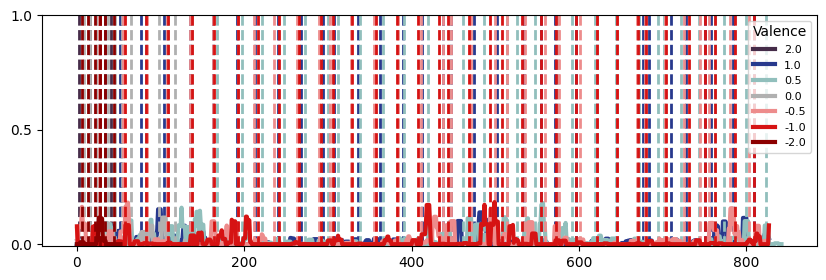

2.0  : [ 3 15 28 33 41 53]
1.0  : [ 26  51  77 104 135 162 191 213 240 268 294 307 336 362 390 412 437 447
 474 502 514 534 555 571 597 622 646 676 684 710 728 750 758 784 809]
0.5  : [ 27  55  82 109 137 167 197 221 247 273 300 312 338 366 391 420 445 461
 486 514 526 548 575 592 619 644 645 672 694 702 722 743 763 773 800 823]
0.0  : [  8  16  24  28  37  46  54  64  98 108 117]
-0.5 : [ 26  55  84 108 135 163 192 212 235 263 289 302 328 355 384 411 437 447
 471 500 514 535 559 576 601 621 645 669 679 703 726 745 755 780 803]
-1.0 : [ 27  58  83 109 137 164 193 216 241 265 292 306 329 357 382 408 433 444
 468 494 508 532 554 573 596 621 645 671 680 704 731 750 762 786 809]
-2.0 : [ 6 13 22 27 33 44]


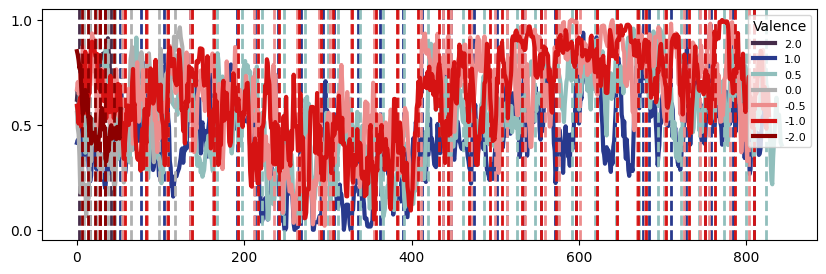

In [12]:
from utilities.plot_helper import moving_avg

def plot_avg_measure(session_obj, session_df_correct, measure='lick_count_window'):
	f, ax = plt.subplots(1, 1, figsize=(10, 3))
	session_df_reinforcement = session_df_correct[session_df_correct['reinforcement_trial'] == 1]
	for valence in sorted(session_df_reinforcement['valence'].unique(), reverse=True):
		# if valence == 0:
		# 	continue
		valence_color = session_obj.valence_colors[valence]
		session_df_valence_correct = session_df_reinforcement[session_df_reinforcement['valence'] == valence]
		plt.plot(moving_avg(list(map(lambda x: np.nanmean(x), session_df_valence_correct[measure].values)), 5),
						color=session_obj.valence_colors[valence],
						label=valence,
						lw=3)
		# find row where 'Block' changes
		# block_change_idx = np.max(session_df_valence_correct['fractal_count_in_block'])
		block_change_idx = np.where(np.diff(session_df_valence_correct['block']) != 0)[0]
		print(f'{valence:<5}: {block_change_idx}')
		for block_change in block_change_idx:
			plt.axvline(x=block_change, color=valence_color, linestyle='--', lw=2)
		plt.yticks(np.arange(0, 1.1, 0.5))
	plt.legend(title='Valence', loc='upper right')
	plt.show()

plot_avg_measure(session_obj, session_df_correct, measure='lick_count_window')
plot_avg_measure(session_obj, session_df_correct, measure='blink_count_window')

  raster_by_cond_1.svg saved.


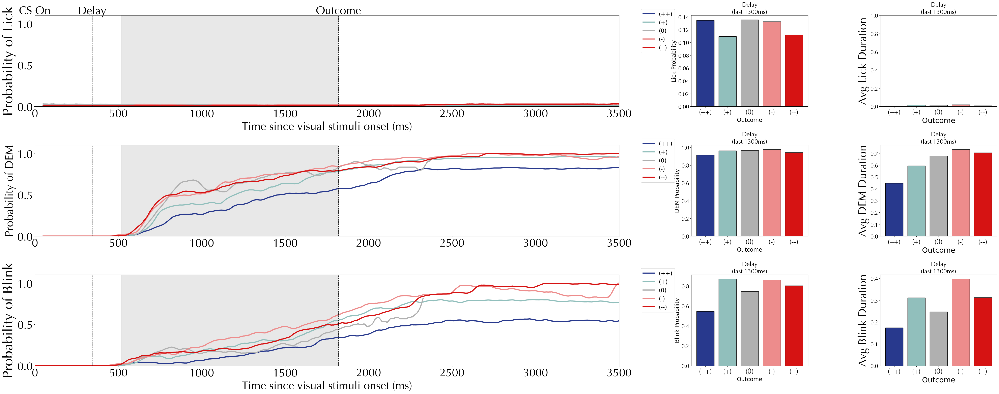

  t_test_lick-duration_1.png saved.


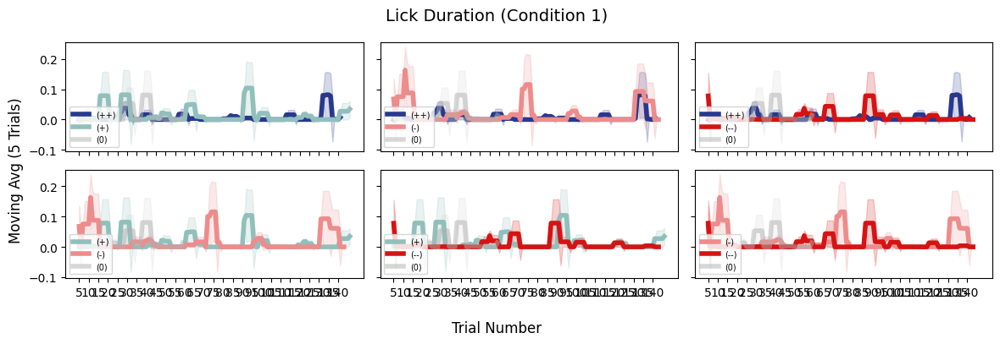

  t_test_DEM-duration_1.png saved.


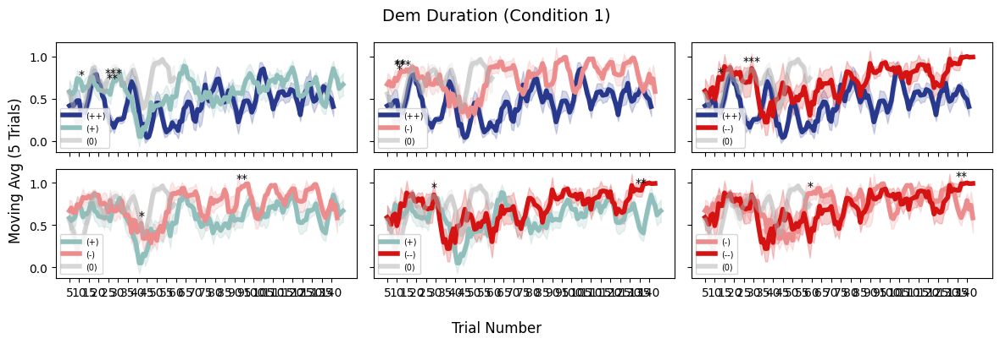

  t_test_blink-duration_1.png saved.


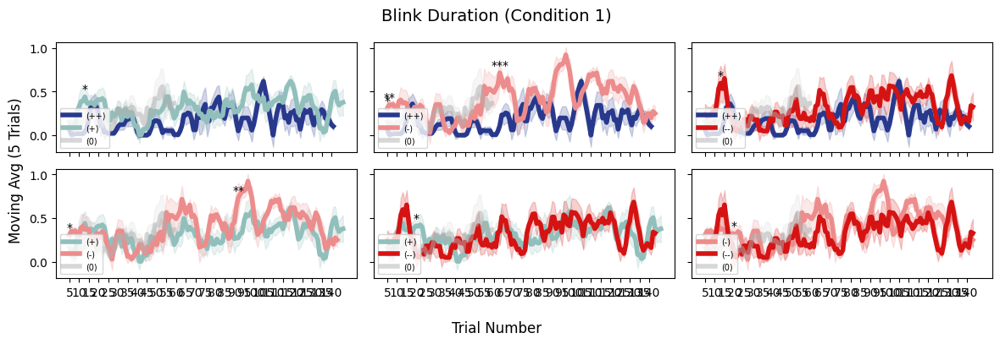

  raster_by_cond_2.svg saved.


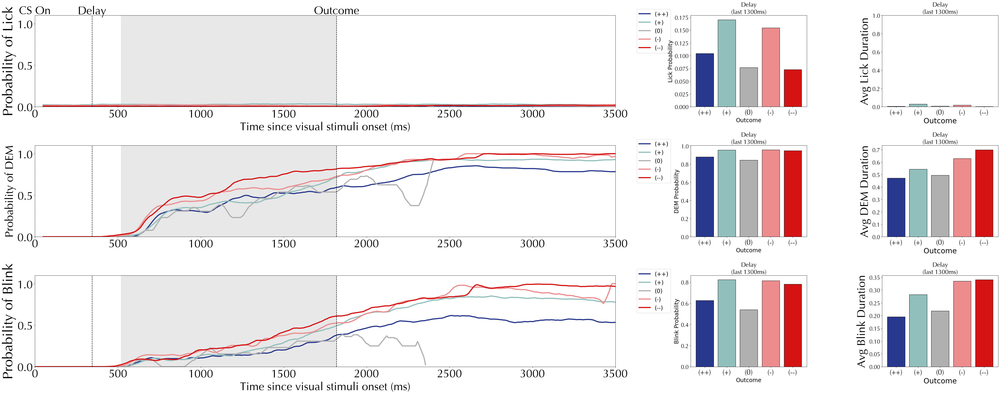

  t_test_lick-duration_2.png saved.


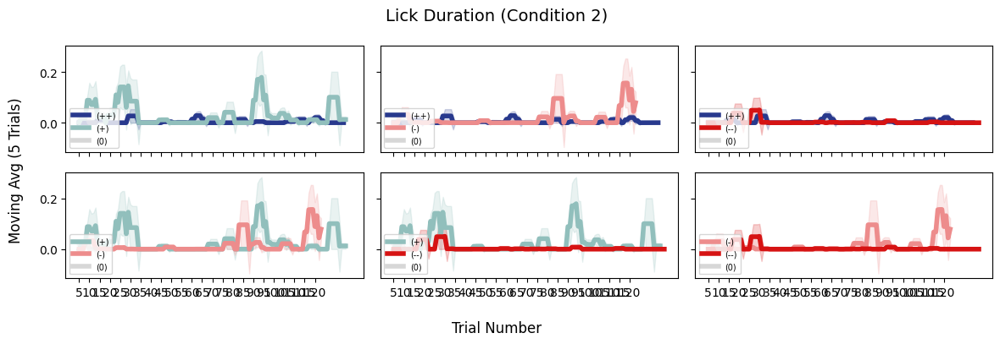

  t_test_DEM-duration_2.png saved.


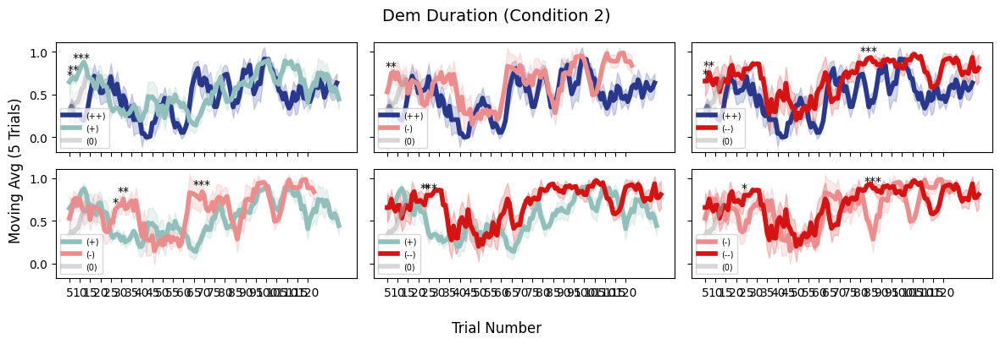

  t_test_blink-duration_2.png saved.


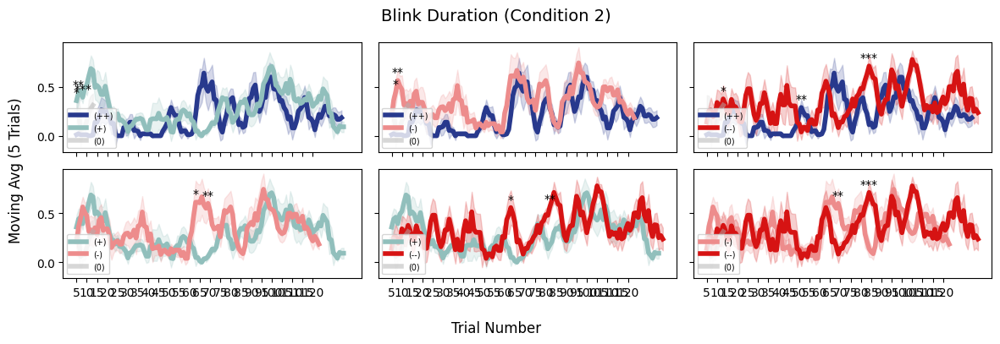

  raster_by_cond_3.svg saved.


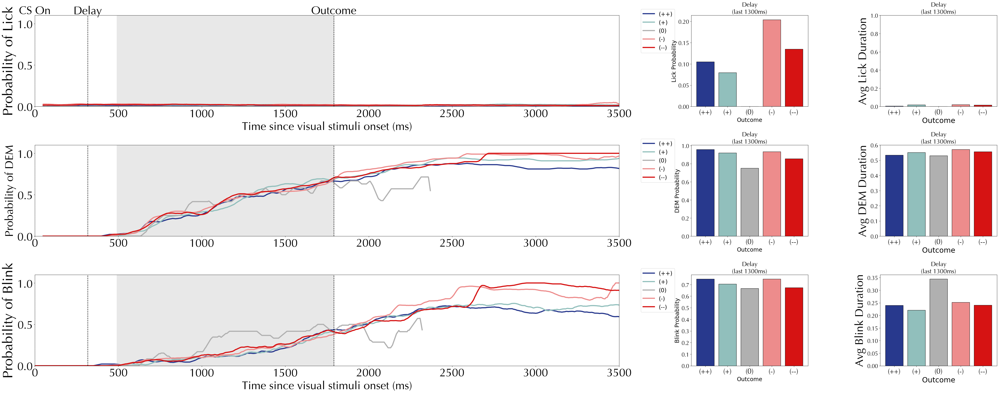

  t_test_lick-duration_3.png saved.


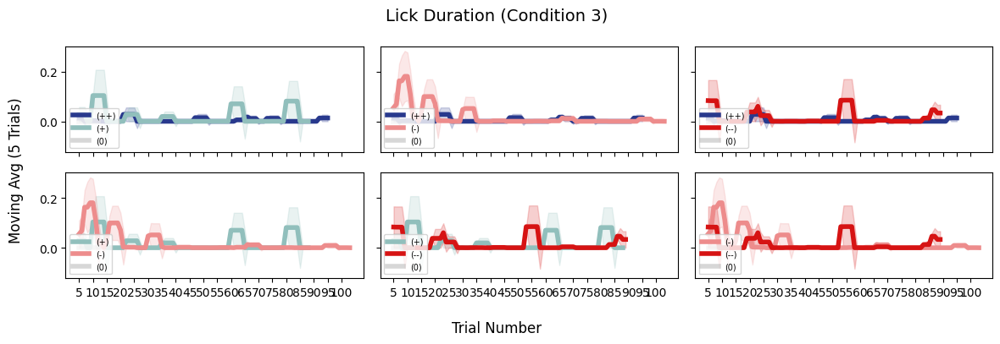

  t_test_DEM-duration_3.png saved.


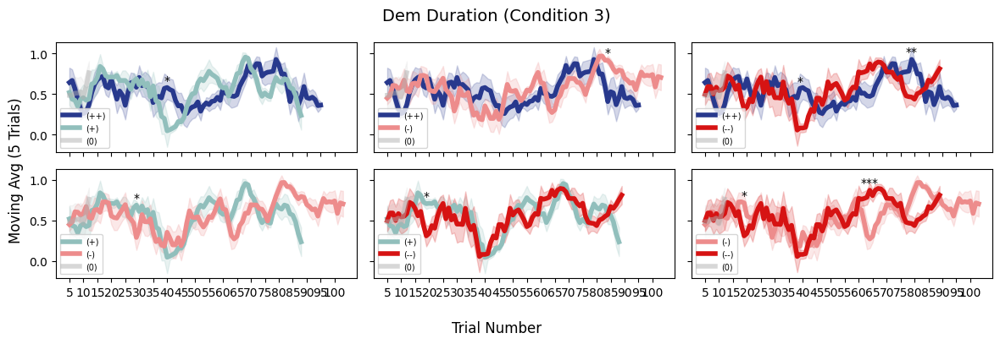

  t_test_blink-duration_3.png saved.


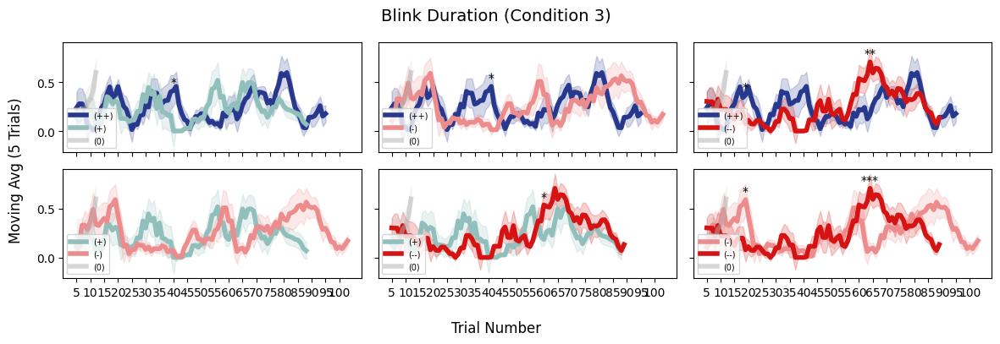

  raster_by_cond_4.svg saved.


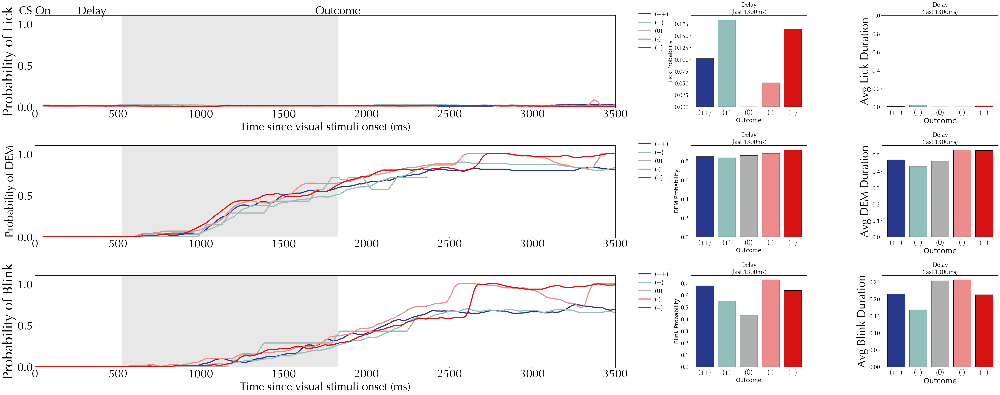

  t_test_lick-duration_4.png saved.


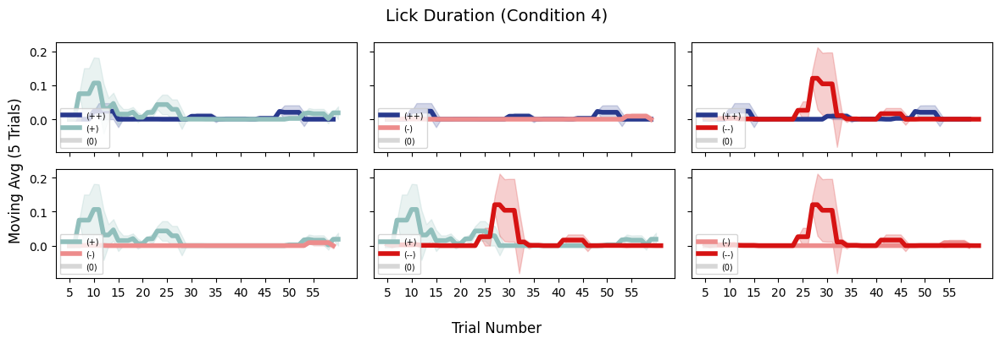

  t_test_DEM-duration_4.png saved.


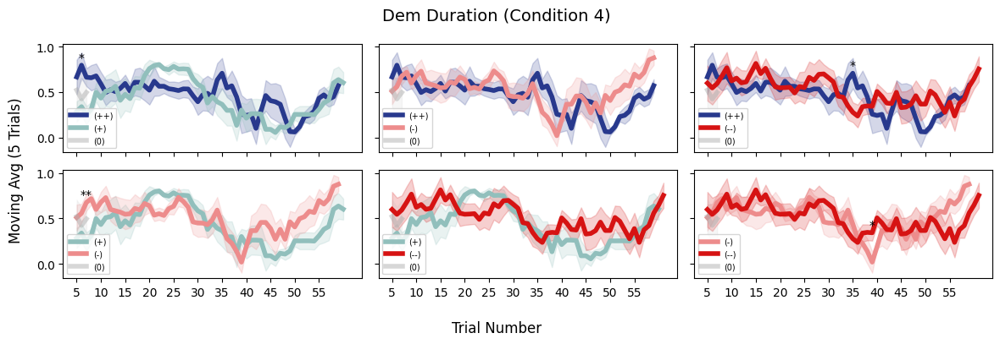

  t_test_blink-duration_4.png saved.


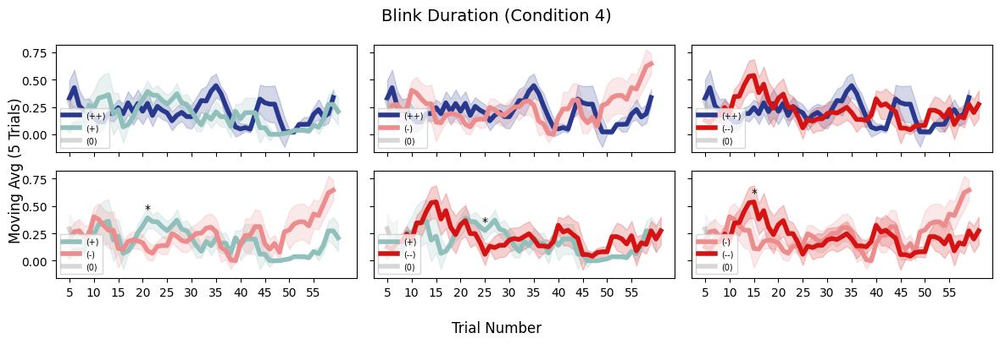

  moving_avg_lick_blink.png saved.


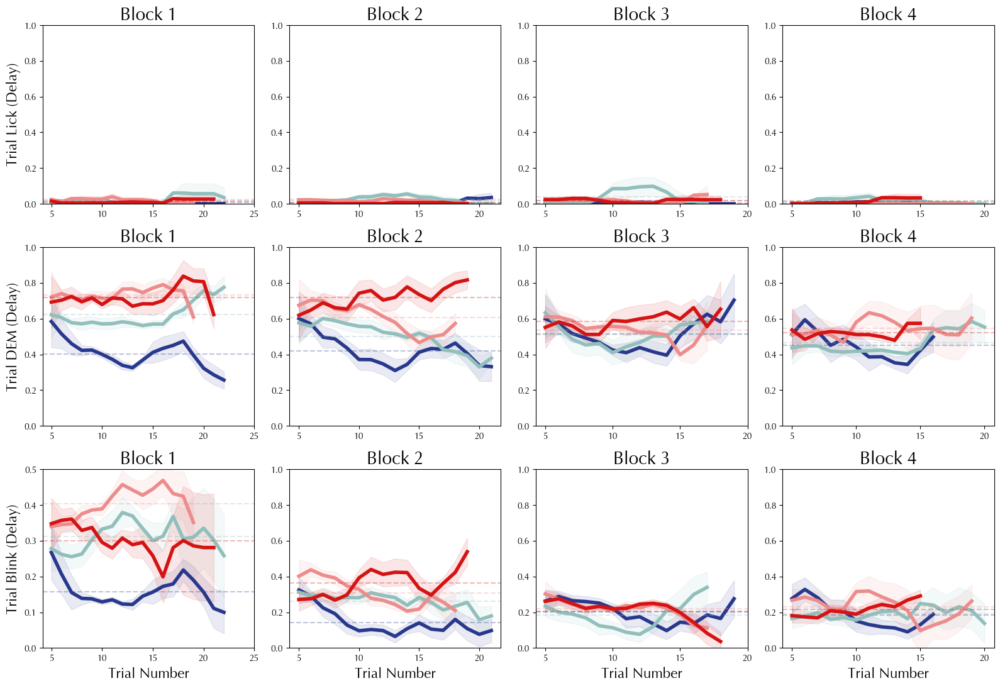

LOOKING ONLY AT VALENCES [-1, -0.5, 0.5, 1]
First 45 trials in block
  Num Trials: 146
  choice_heatmap_45.svg saved.


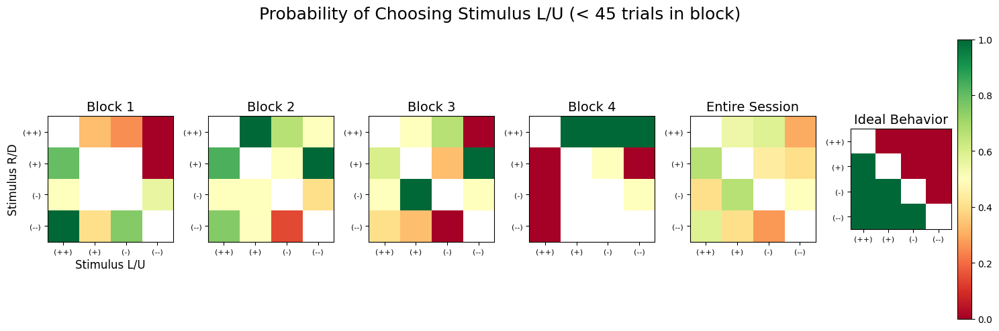

Trials 45 - 90 in block
  Num Trials: 51
  choice_heatmap_90.svg saved.


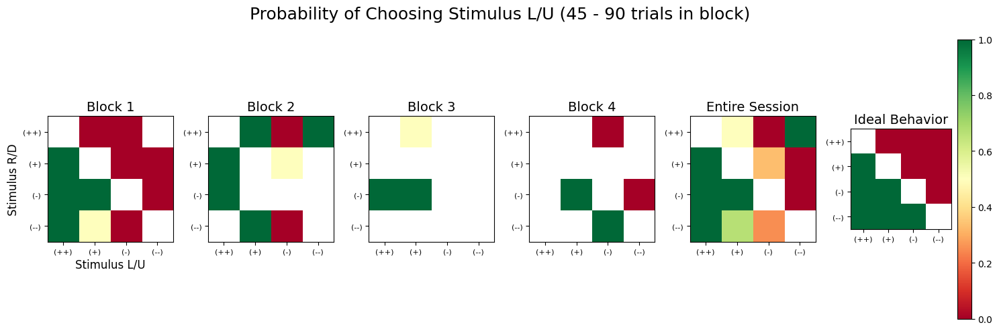

Trials 90 - 125 in block
No choice trials to plot.
  df_choice_valence_240801.svg saved.


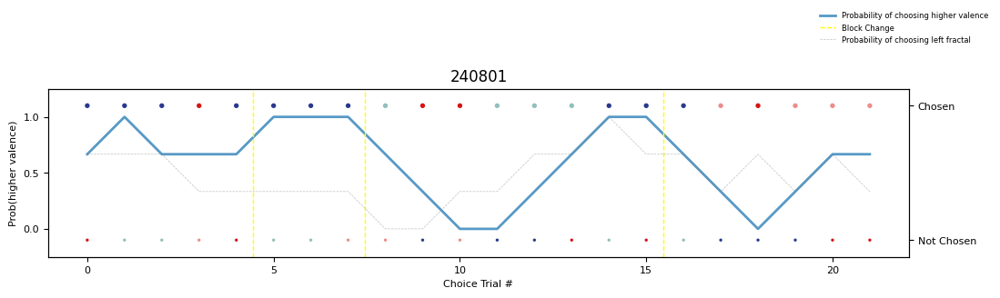

  df_choice_valence_240806.svg saved.


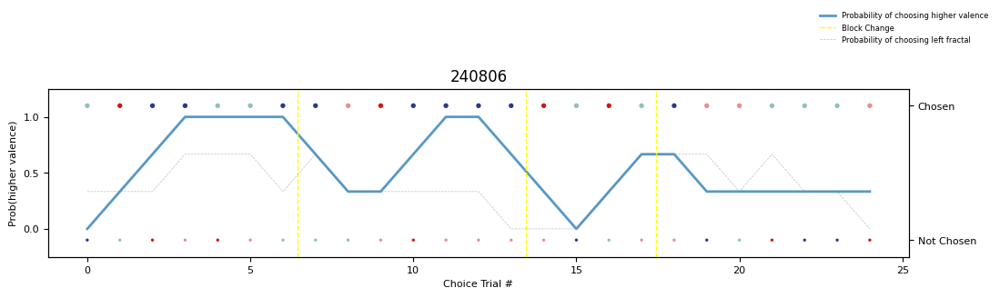

  df_choice_valence_240815.svg saved.


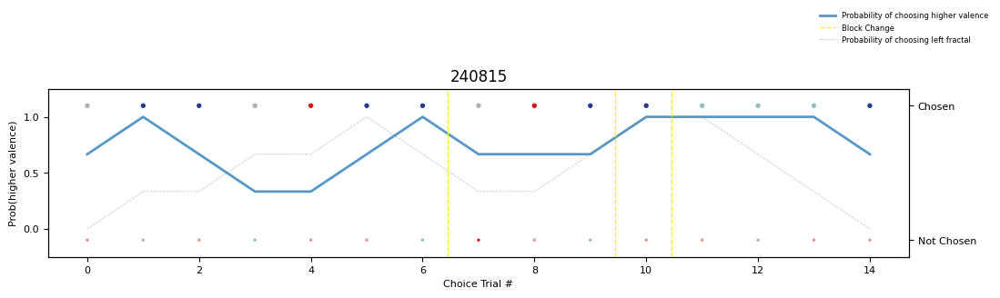

  df_choice_valence_240818.svg saved.


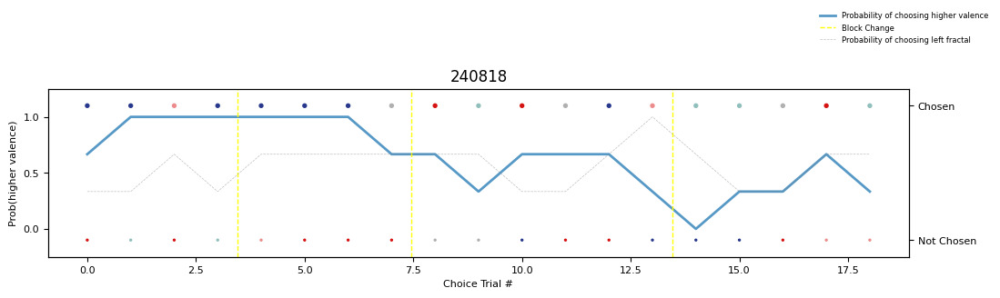

  df_choice_valence_241127.svg saved.


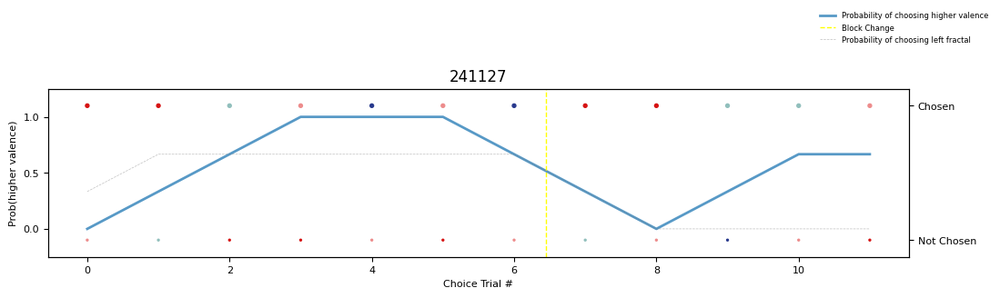

  df_choice_valence_241206.svg saved.


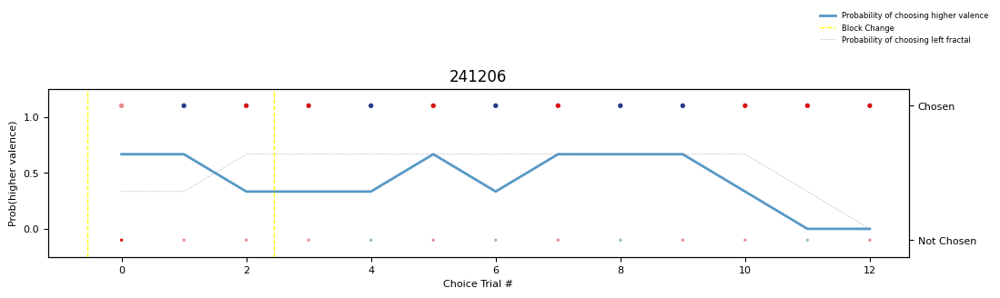

  df_choice_valence_241209.svg saved.


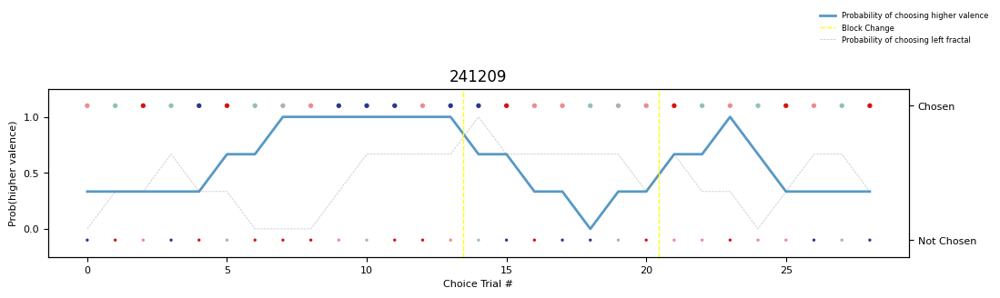

  df_choice_valence_241211.svg saved.


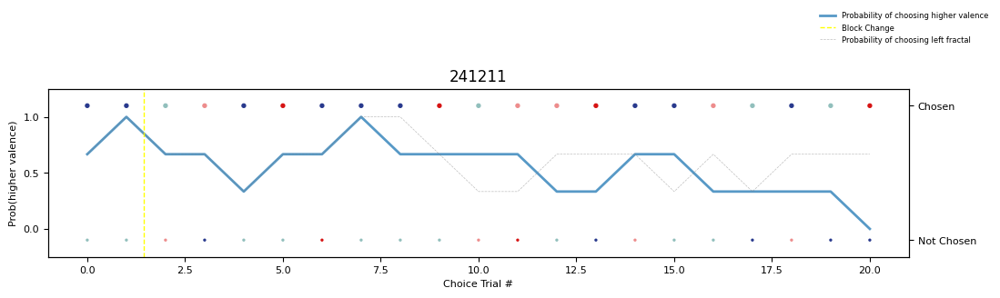

  df_choice_valence_241214.svg saved.


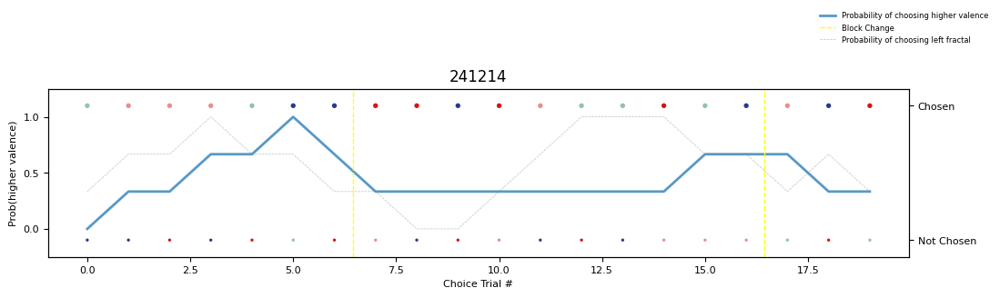

  df_choice_valence_241218.svg saved.


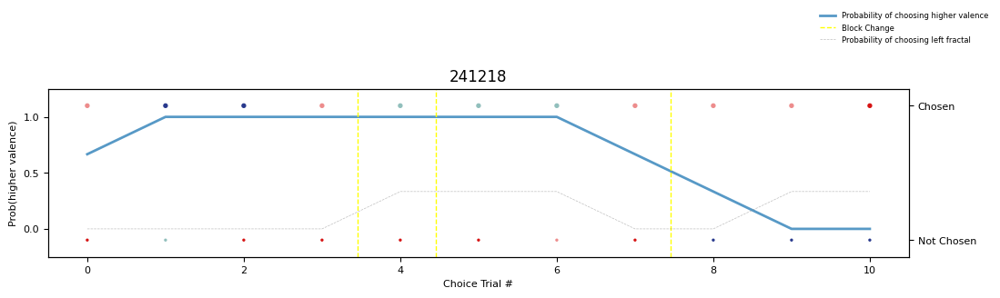

  df_choice_valence_241223.svg saved.


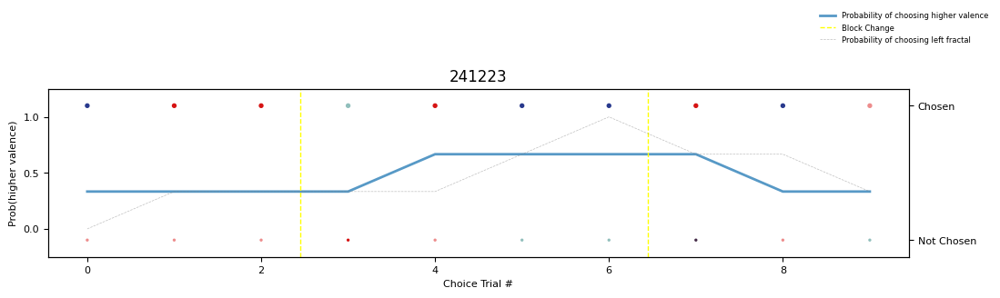


Generating session summary: /Users/rahimhashim/Google Drive/My Drive/Columbia/Salzman/Monkey-Training/docs/Tracker/Emotion/markdowns
  Writing 20240801_aragorn.md
  Writing 20240806_aragorn.md
  Writing 20240815_aragorn.md
  Writing 20240818_aragorn.md
  Writing 20241127_aragorn.md
  Writing 20241206_aragorn.md
  Writing 20241209_aragorn.md
  Writing 20241211_aragorn.md
  Writing 20241214_aragorn.md
  Writing 20241218_aragorn.md
  Writing 20241223_aragorn.md
Writing to excel...
  raster_by_cond_1.svg saved.


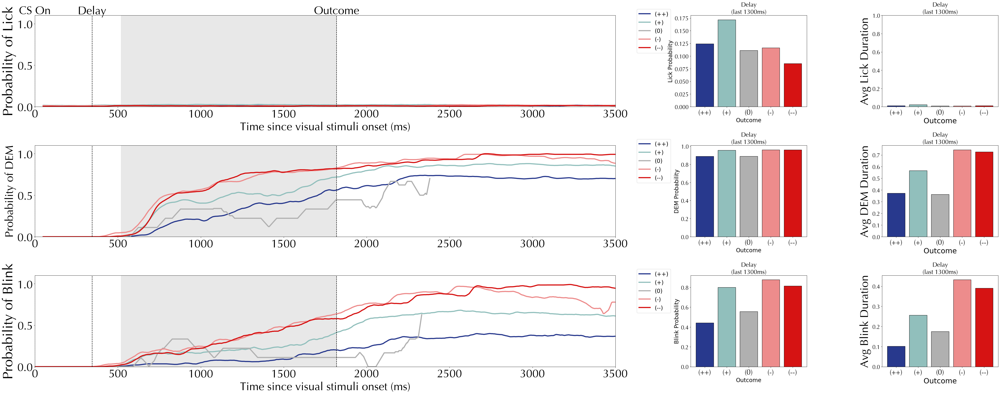

  t_test_lick-duration_1.png saved.


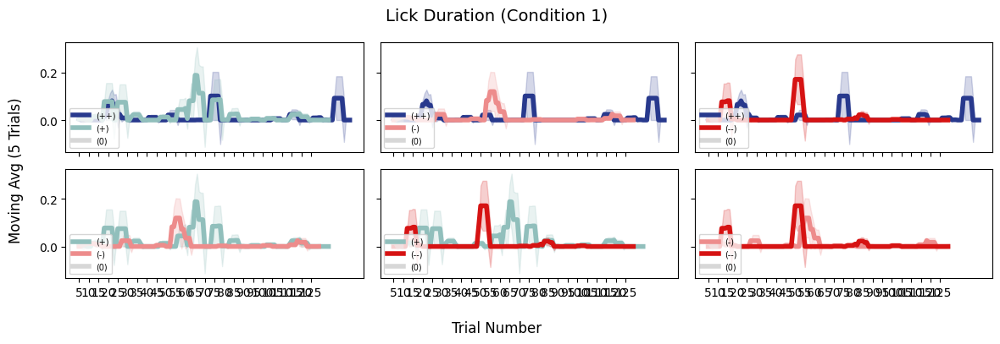

  t_test_DEM-duration_1.png saved.


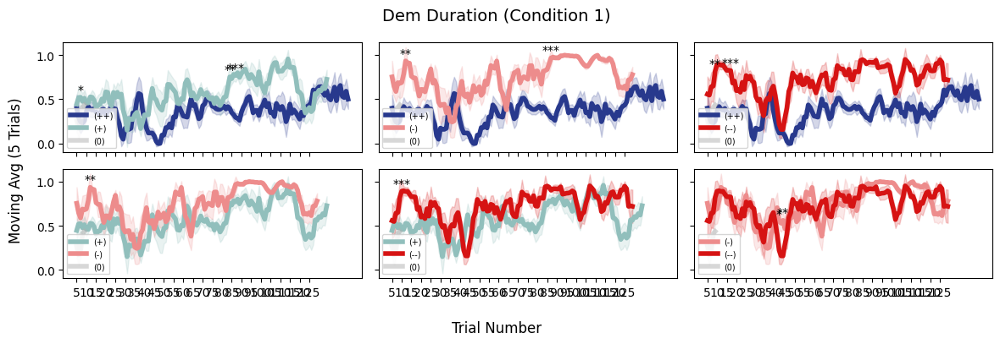

  t_test_blink-duration_1.png saved.


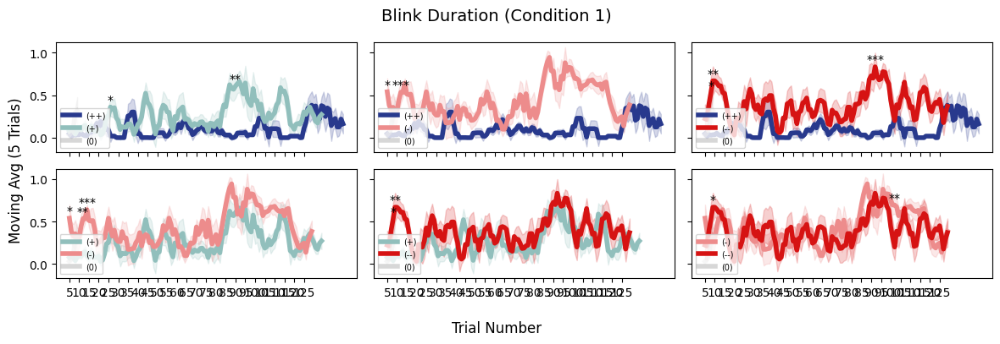

  raster_by_cond_2.svg saved.


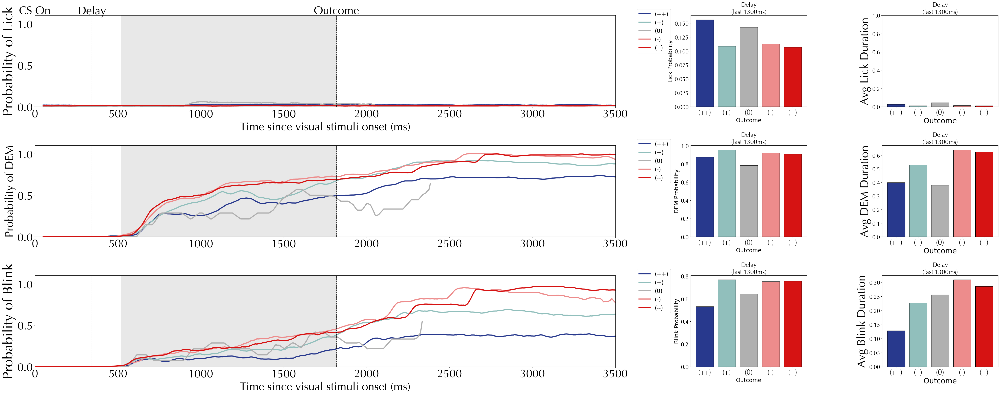

  t_test_lick-duration_2.png saved.


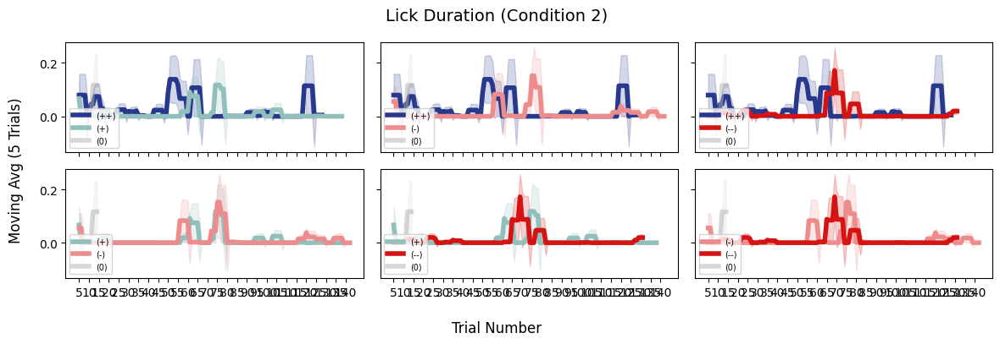

  t_test_DEM-duration_2.png saved.


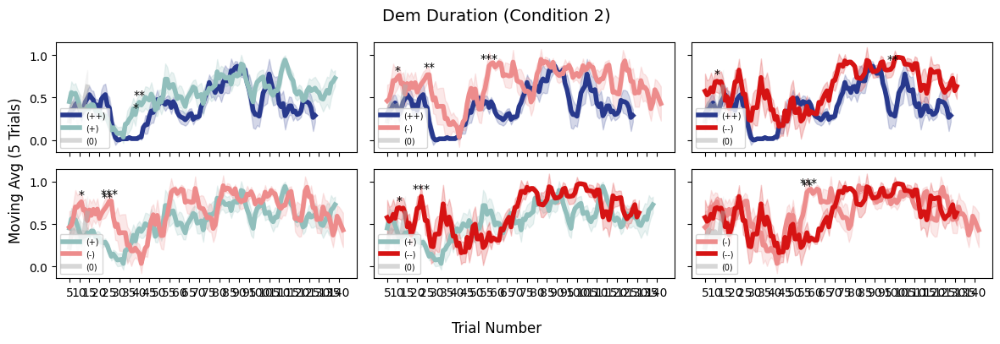

  t_test_blink-duration_2.png saved.


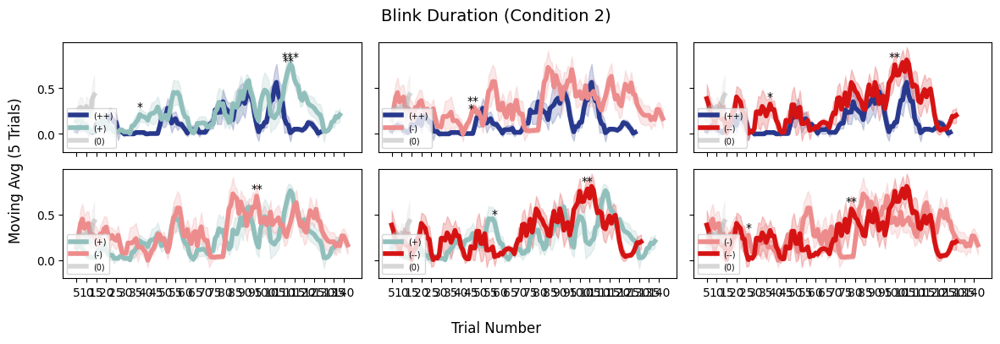

  raster_by_cond_3.svg saved.


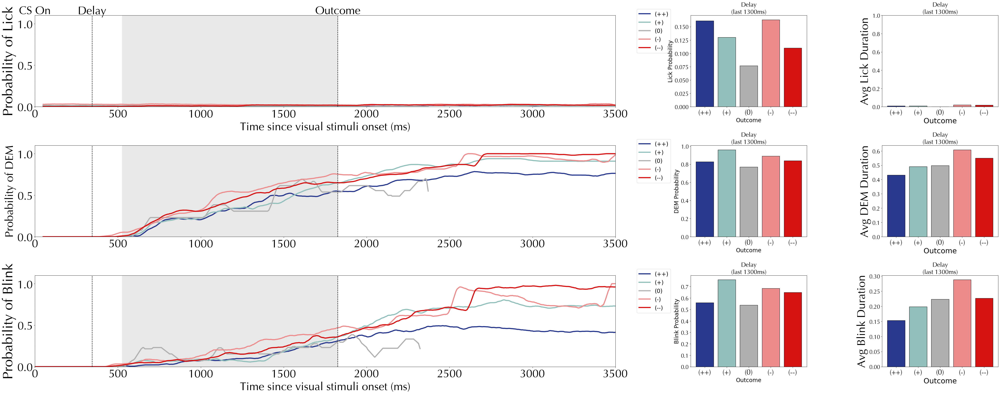

  t_test_lick-duration_3.png saved.


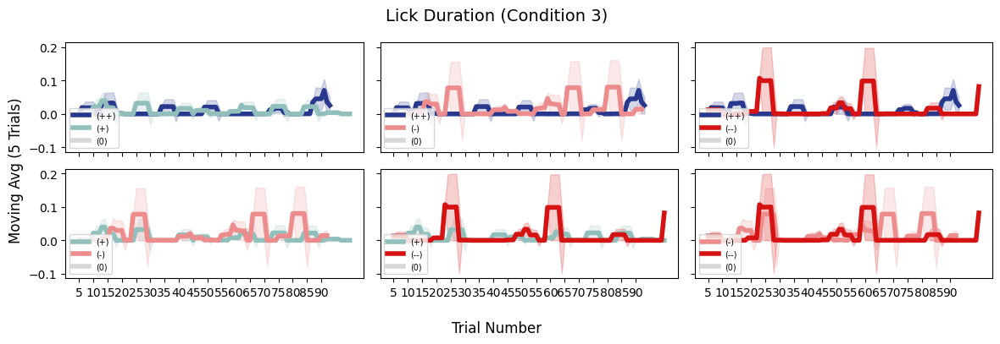

  t_test_DEM-duration_3.png saved.


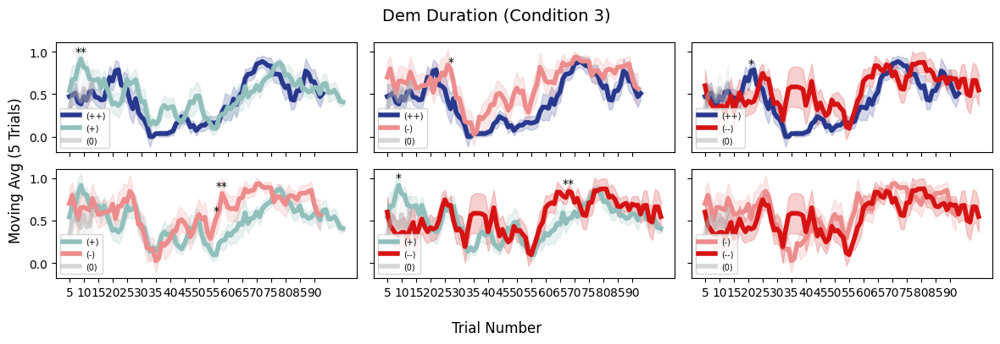

  t_test_blink-duration_3.png saved.


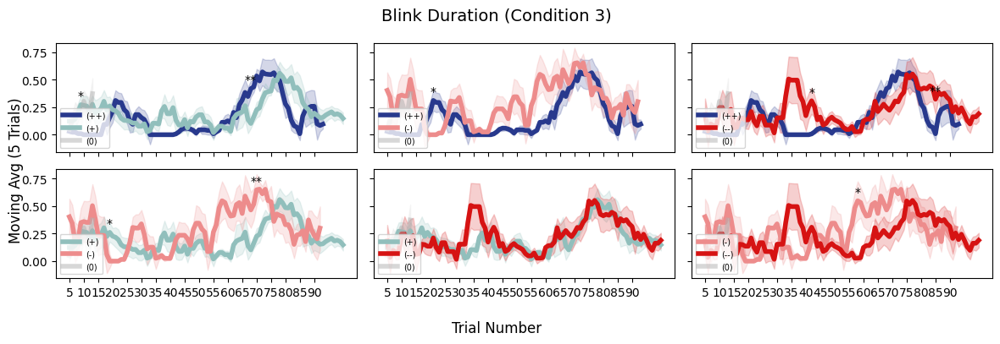

  raster_by_cond_4.svg saved.


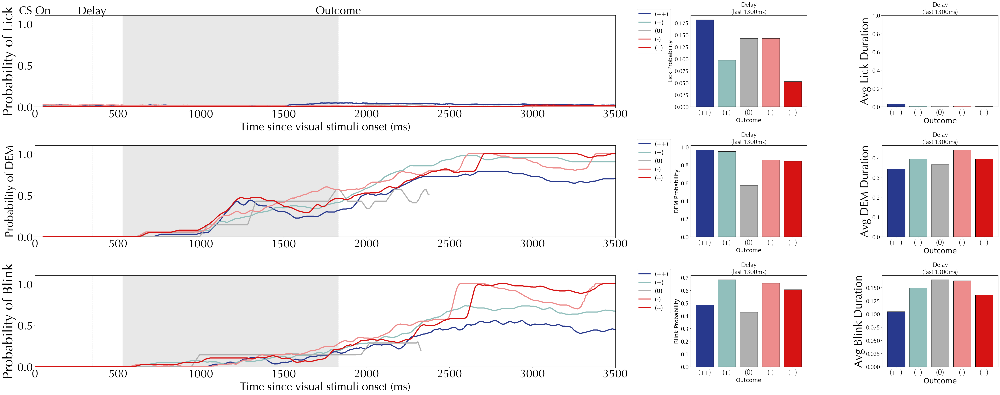

  t_test_lick-duration_4.png saved.


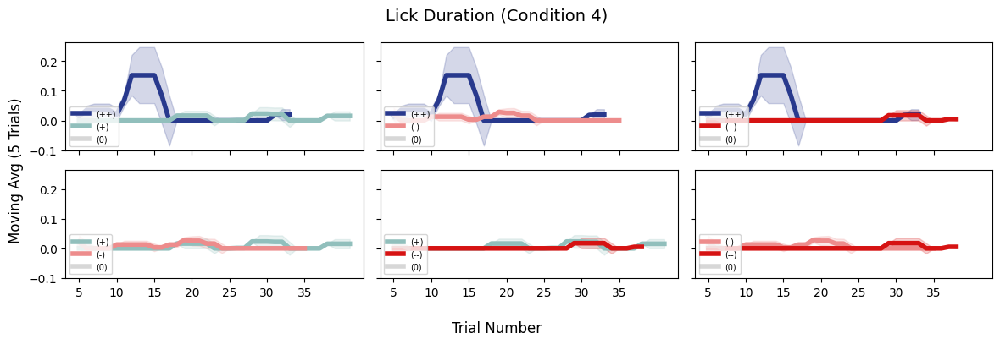

  t_test_DEM-duration_4.png saved.


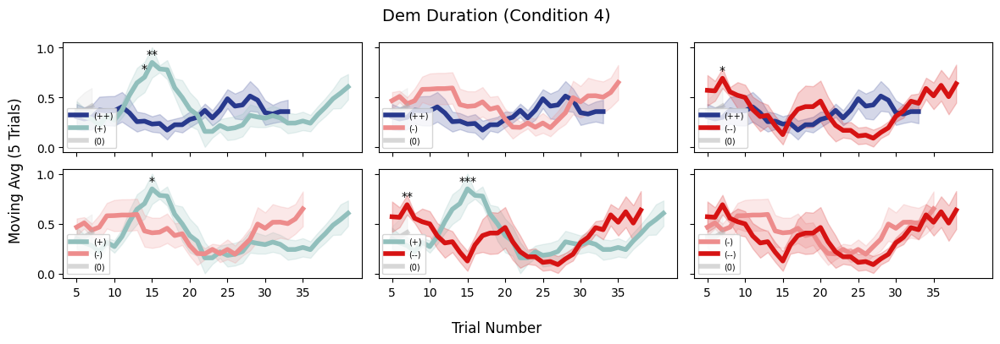

  t_test_blink-duration_4.png saved.


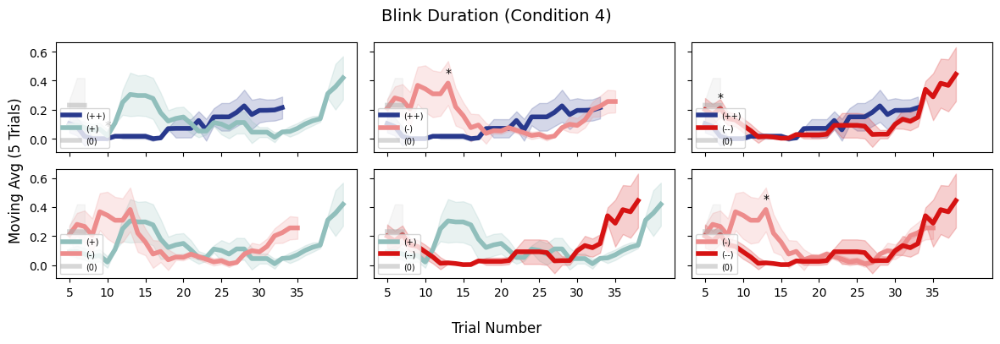

  moving_avg_lick_blink.png saved.


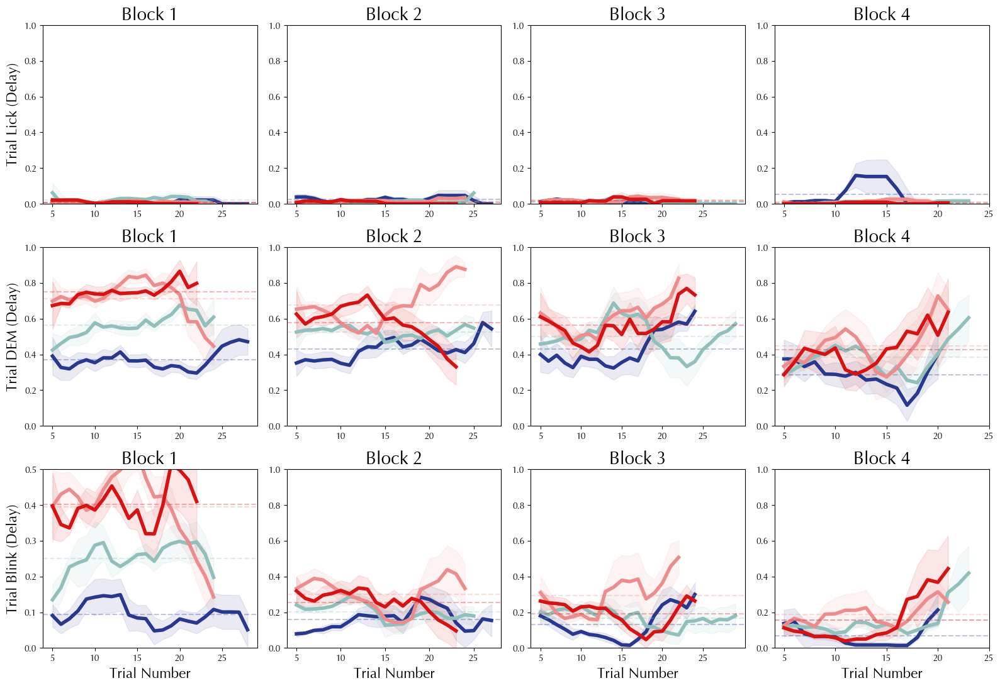

LOOKING ONLY AT VALENCES [-1, -0.5, 0.5, 1]
First 45 trials in block
  Num Trials: 7
  choice_heatmap_45.svg saved.


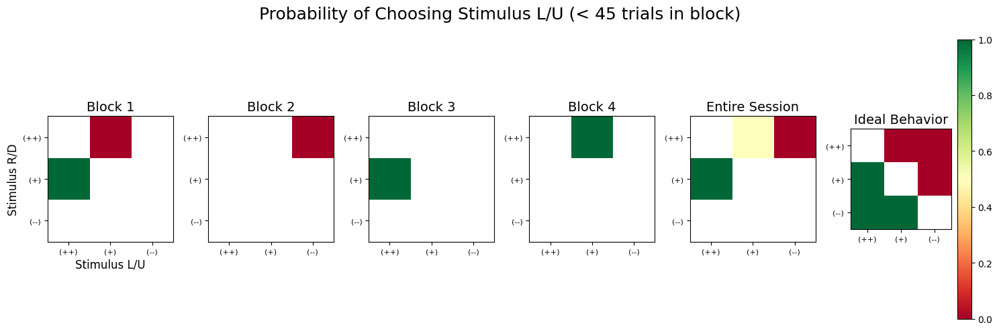

Trials 45 - 90 in block
  Num Trials: 103
  choice_heatmap_90.svg saved.


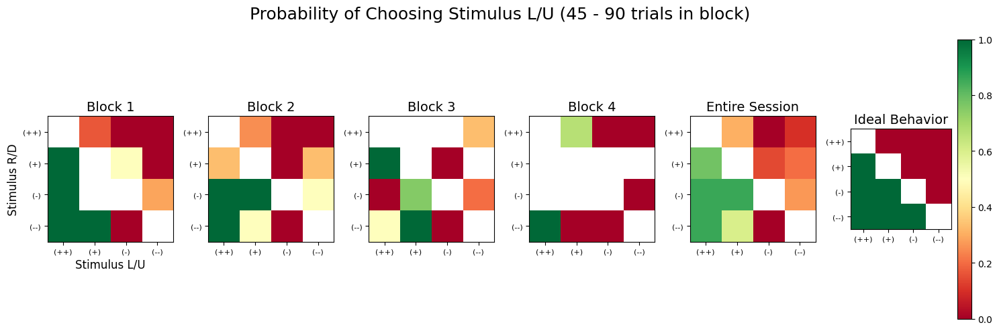

Trials 90 - 125 in block
  Num Trials: 104
  choice_heatmap_125.svg saved.


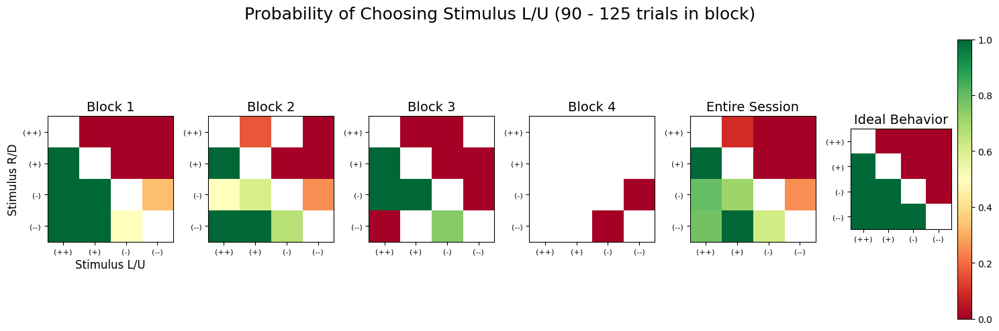

All trials in block
  Num Trials: 214
  choice_heatmap_200.svg saved.


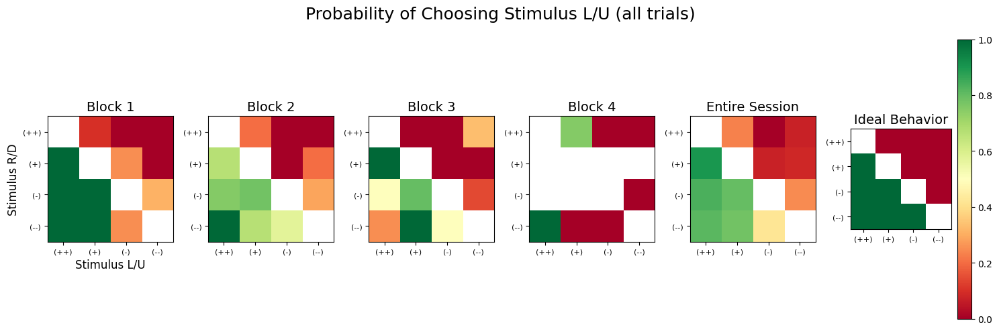

  df_choice_valence_240801.svg saved.


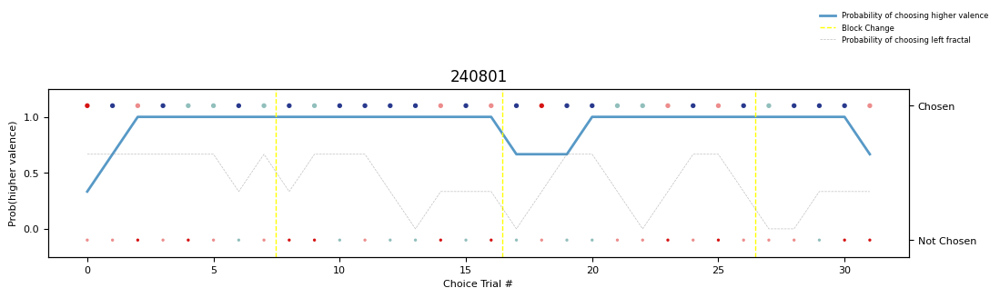

  df_choice_valence_240806.svg saved.


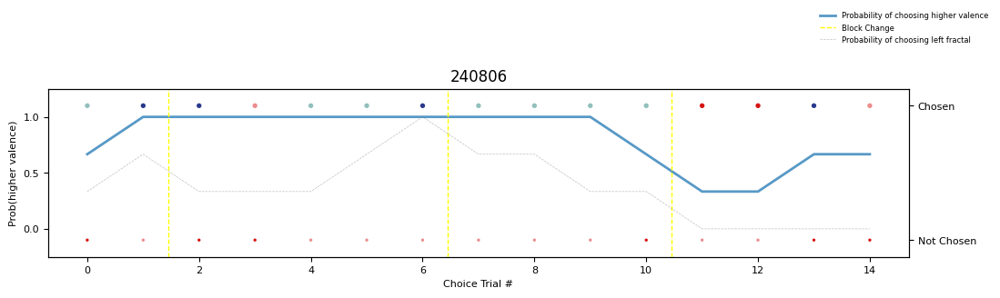

  df_choice_valence_240815.svg saved.


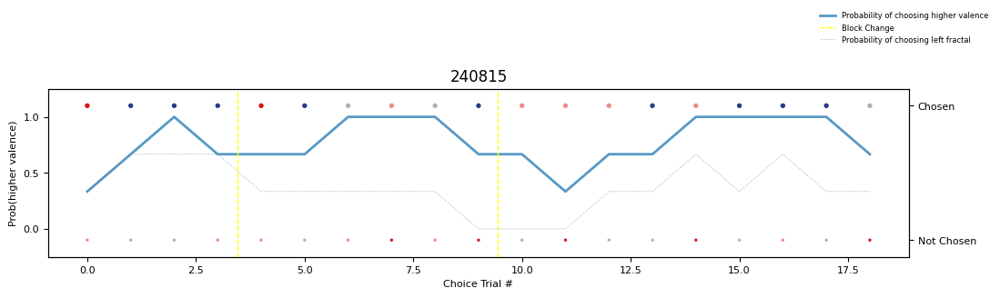

  df_choice_valence_240818.svg saved.


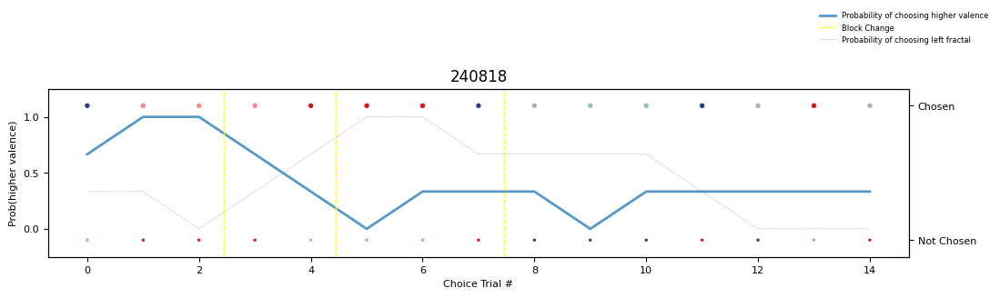

  df_choice_valence_241127.svg saved.


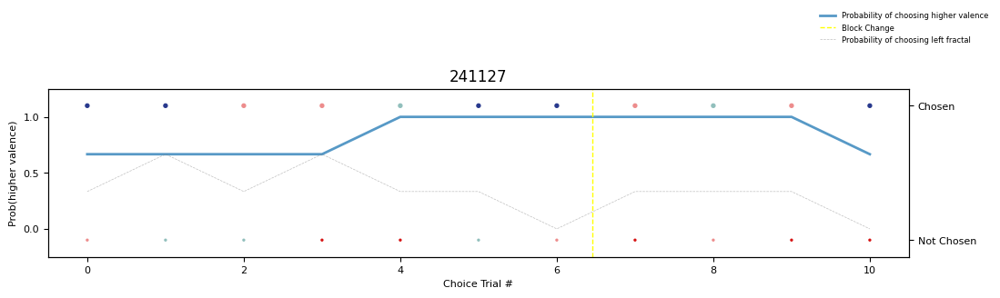

  df_choice_valence_241206.svg saved.


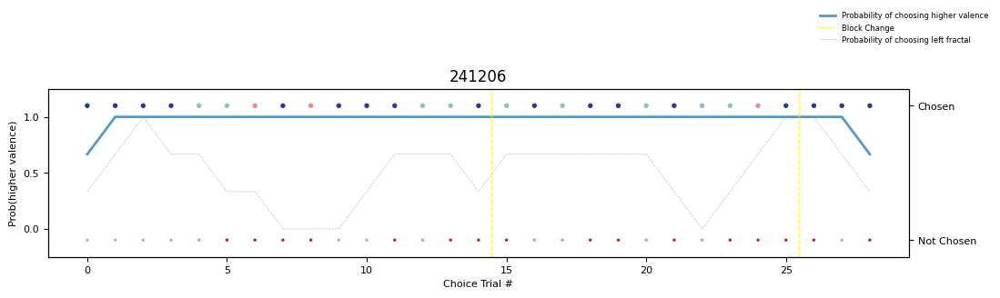

  df_choice_valence_241209.svg saved.


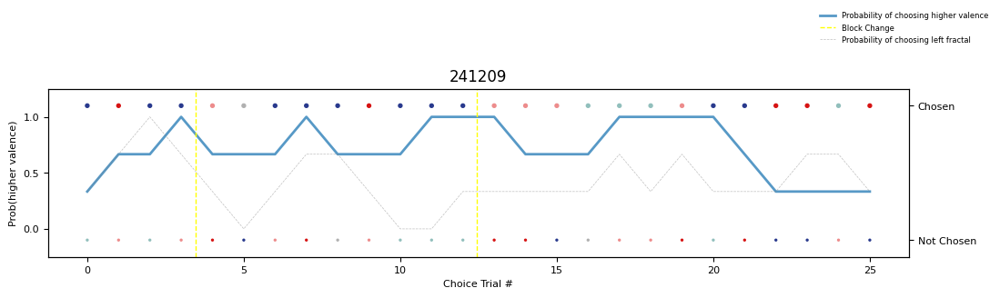

  df_choice_valence_241211.svg saved.


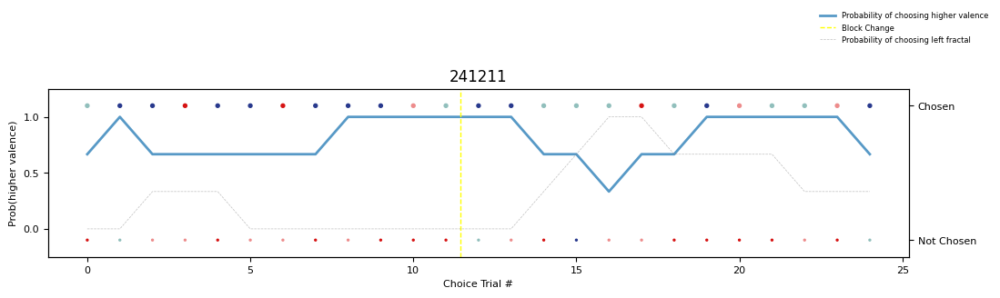

  df_choice_valence_241214.svg saved.


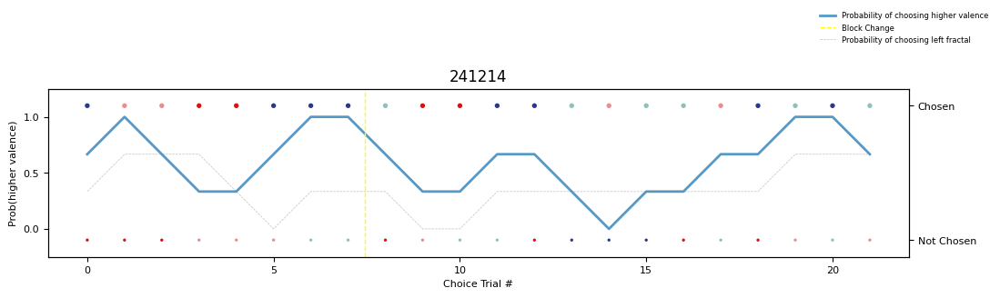

  df_choice_valence_241218.svg saved.


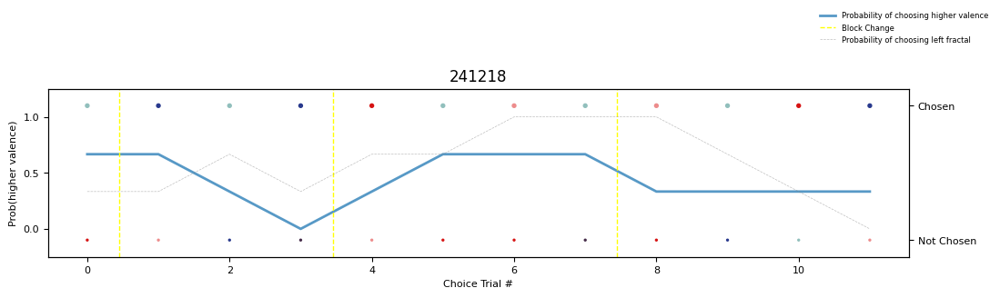

  df_choice_valence_241223.svg saved.


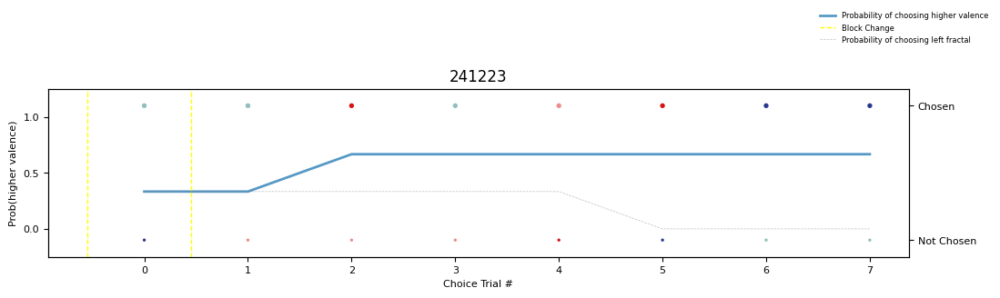


Generating session summary: /Users/rahimhashim/Google Drive/My Drive/Columbia/Salzman/Monkey-Training/docs/Tracker/Emotion/markdowns
  Writing 20240801_aragorn.md
  Writing 20240806_aragorn.md
  Writing 20240815_aragorn.md
  Writing 20240818_aragorn.md
  Writing 20241127_aragorn.md
  Writing 20241206_aragorn.md
  Writing 20241209_aragorn.md
  Writing 20241211_aragorn.md
  Writing 20241214_aragorn.md
  Writing 20241218_aragorn.md
  Writing 20241223_aragorn.md
Writing to excel...


In [49]:
from analyses.run_functions import run_functions

# dates = session_df['date'].unique()
# for date in dates:
# 	print(date)
# 	session_df_date = session_df[session_df['date'] == date]
# 	session_obj = run_functions(session_df_date, session_obj, path_obj, 
# 															behavioral_code_dict, error_dict)
# session_df_nonzero = session_df[session_df['valence'] != 0]

session_df_early = session_df[
	(session_df['valence'] > -2) 
	& (session_df['valence'] < 2) 
	& (session_df['trial_in_block'] < 90)
]

session_df_late = session_df[
	(session_df['valence'] > -2) 
	& (session_df['valence'] < 2) 
	& (session_df['trial_in_block'] > 90)
]

session_obj = run_functions(
	session_df_early, 
	session_obj,
	path_obj, 
	behavioral_code_dict, 
	error_dict
)

session_obj = run_functions(
	session_df_late, 
	session_obj,
	path_obj, 
	behavioral_code_dict, 
	error_dict
)

In [8]:
from analyses.choice_plots import plot_heatmap_choice_valence, plot_avg_choice_valence
print('LOOKING ONLY AT VALENCES [-1, -0.5, 0.5, 1]')
df_selected_valence = session_df_correct[session_df_correct['valence_1'].isin([1, 0.5, -0.5, -1])]
plot_heatmap_choice_valence(df_selected_valence, session_obj)
plot_avg_choice_valence(df_selected_valence, session_obj)

LOOKING ONLY AT VALENCES [-1, -0.5, 0.5, 1]
First 45 trials in block
No choice trials to plot.
No choice trials to plot.


### Look at lick rate by block for novel fractals

Analyzing Lick Difference Between Blocks
  Block 1: ~3.95 drops/trial
    Valence -2.0: ~0.0  outcome/trial (n=13)
    Valence -1.0: ~0.0  outcome/trial (n=272)
    Valence -0.5: ~0.0  outcome/trial (n=272)
    Valence 0.0 : ~0.0  outcome/trial (n=68)
    Valence 0.5 : ~4.2  outcome/trial (n=281)
    Valence 1.0 : ~11.6 outcome/trial (n=288)
    Valence 2.0 : ~20.0 outcome/trial (n=12)
  Block 2: ~4.11 drops/trial
    Valence -2.0: ~0.0  outcome/trial (n=18)
    Valence -1.0: ~0.0  outcome/trial (n=270)
    Valence -0.5: ~0.0  outcome/trial (n=265)
    Valence 0.0 : ~0.0  outcome/trial (n=27)
    Valence 0.5 : ~4.21 outcome/trial (n=274)
    Valence 1.0 : ~11.6 outcome/trial (n=263)
    Valence 2.0 : ~20.0 outcome/trial (n=24)
  Block 3: ~4.12 drops/trial
    Valence -2.0: ~0.0  outcome/trial (n=21)
    Valence -1.0: ~0.0  outcome/trial (n=189)
    Valence -0.5: ~0.0  outcome/trial (n=197)
    Valence 0.0 : ~0.0  outcome/trial (n=25)
    Valence 0.5 : ~4.3  outcome/trial (n=190)
    Va

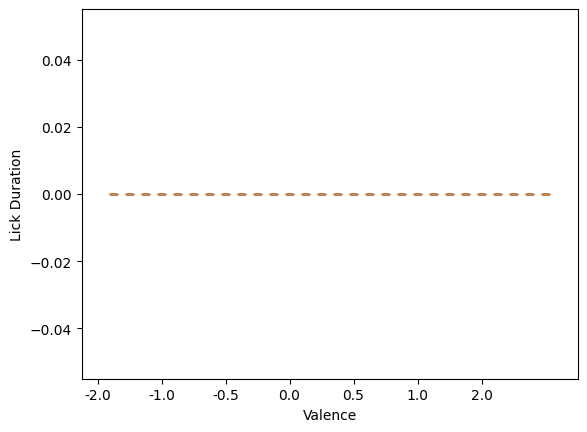

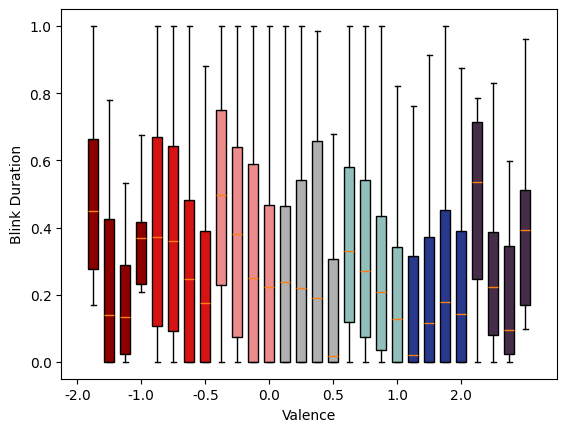

In [14]:
# see the average number of rewarded reinforcement trials in block 1 vs block 2
for behavior_field in ['lick_duration', 'blink_duration_window']:
	behavior = behavior_field.split('_')[0]
	print(f'Analyzing {behavior.capitalize()} Difference Between Blocks')
	f, ax = plt.subplots(1,1, sharey=True)
	session_df_reinforcement = session_df_correct[session_df_correct['reinforcement_trial'] == 1]
	for block in session_df_reinforcement['block'].unique():
		session_df_block = session_df_reinforcement[session_df_reinforcement['block'] == block]
		# skip if <10 trials in the block
		if len(session_df_block) < 10:
			continue
		if behavior == 'lick':
			outcome = 'reward_drops_1'
		else:
			outcome = 'airpuff_mag_1'
		avg_reward_drops_block = session_df_block[outcome].mean()
		print(f'  Block {block}: ~{round(avg_reward_drops_block, 2)} drops/trial')
		unique_valences = sorted(session_df_reinforcement['valence'].unique())
		for vix, valence in enumerate(unique_valences):
			avg_reward_drops_block_valence = session_df_block[session_df_block['valence'] == valence][outcome]
			avg_reward_drops_block_valence_mean = avg_reward_drops_block_valence.mean()
			print(f'    Valence {valence:<4}: ~{round(avg_reward_drops_block_valence_mean, 2):<4} outcome/trial (n={len(avg_reward_drops_block_valence)})')
			session_df_block_fractal = session_df_block[session_df_block['valence'] == valence]
			lick_rate_fractal = session_df_block_fractal[behavior_field].tolist()
			# double box plot of lick rate without outliers where each block value is next to each other
			color = session_obj.valence_colors[valence]
			# set color to color
			pos_shift = 0.25*block
			# make a half violin plot
			ax.boxplot(lick_rate_fractal, positions=[vix + pos_shift], patch_artist=True, boxprops=dict(facecolor=color), showfliers=False)
		# set x tick labels for the middle of the double box plot
		ax.set_xticks(range(len(unique_valences)))
		ax.set_xticklabels(unique_valences)
		ax.set_xlabel('Valence')
		ax.set_ylabel(f'{behavior_field.split("_")[0].capitalize()} Duration')

AttributeError: 'numpy.ndarray' object has no attribute 'plot'

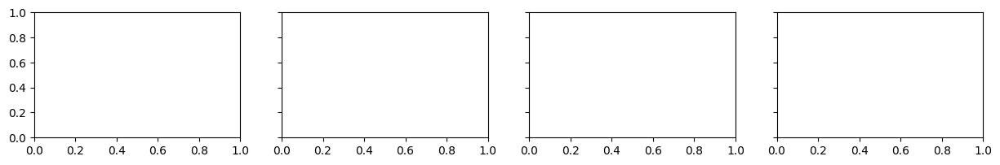

In [38]:
def novel_fractal_summary(session_df):
	session_df_correct = session_df[session_df['correct'] == 1]
	session_df_reinforcement = session_df_correct[session_df_correct['reinforcement_trial'] == 1]
	blocks = session_df_reinforcement['block'].unique()
	valences = session_df_reinforcement['valence'].unique()
	
	f, axarr = plt.subplots(1, len(blocks), figsize=(15, 2), sharey=True, squeeze=False)
	for block in blocks:
		session_high_reward = session_df_reinforcement.loc[(session_df_reinforcement['valence'] == 1) & (session_df_reinforcement['block'] == block)]
		session_high_airpuff = session_df_reinforcement.loc[(session_df_reinforcement['valence'] == -1) & (session_df_reinforcement['block'] == block)]
		session_novel = session_df_reinforcement.loc[(session_df_reinforcement['fractal_chosen_novel'] == '_fractal_novel') & (session_df_reinforcement['block'] == block)]
		session_high_reward_lick = session_high_reward['lick_duration']
		session_high_airpuff_lick = session_high_airpuff['lick_duration']
		session_novel_lick = session_novel['lick_duration']
		axarr[block-1].plot(range(len(session_novel_lick)), session_novel_lick, label='novel stimuli', color='grey', lw=5)
		axarr[block-1].plot(range(len(session_high_reward_lick)), session_high_reward_lick, label='high reward stimuli', color='blue', lw=5)
		axarr[block-1].plot(range(len(session_high_airpuff_lick)), session_high_airpuff_lick, label='high airpuff stimuli', color='red', lw=5)
		session_neutral = session_df_reinforcement.loc[(session_df_reinforcement['valence'] == 0) &
																									 (session_df_reinforcement['fractal_chosen_novel'] != '_fractal_novel') & 
																									 (session_df_reinforcement['block'] == block)]
		if len(session_neutral) > 0:
			session_neutral_lick = session_neutral['lick_duration']
			axarr[block-1].plot(range(len(session_neutral_lick)), session_neutral_lick, label='neutral stimuli', color='yellow', lw=5)
		# # select row with index block_change
		axarr[block-1].set_xlabel('Trial Number')
		if block == 1:
			axarr[block-1].set_ylabel('Percentage of Delay Licking', fontsize=10)
		axarr[block-1].set_title(f'Block {block}')
	plt.show()

	gs_kw = dict(width_ratios=[4, 1])
	f, axarr = plt.subplots(len(blocks), 2, figsize=(10, 10), gridspec_kw=gs_kw, sharey=True, squeeze=False)
	max_fractal_presentations = np.max(session_df_correct['fractal_count_in_block'])
	for block in blocks:
		for valence in valences:
			session_outcome = session_df_reinforcement.loc[(session_df_reinforcement['valence'] == valence) & (session_df_reinforcement['block'] == block)]
			block_blink = session_outcome['blink_duration_window']
			session_high_reward_blink = session_outcome['blink_duration_window']
			color = session_obj.valence_colors[valence]
			axarr[block-1][0].plot(range(len(block_blink)), block_blink, label='neutral stimuli', color=color, lw=3)
			# # select row with index block_change
			if block == len(blocks):
				axarr[block-1][0].set_xlabel('Trial Number')
			axarr[block-1][0].set_ylabel('Percentage of Delay Blinking', fontsize=10)
			axarr[block-1][0].set_title(f'Block {block}')
			axarr[block-1][0].set_xticks(range(0, max_fractal_presentations, 5))
	plt.tight_layout()
	plt.show()

novel_fractal_summary(session_df_correct)

***
## Valence Trial Analyses
### Higher Valence and Reaction Time Performance on Choice Trials

In [15]:
from analyses import print_performance
print_performance.print_performance(session_df)
print('\n')
print_performance.reaction_time_choice(session_df)

Session Performance
 Percent successful reinforcement trials: 0.915 (3594/3926)
   Valence 2.0: 0.928 (64/69)
   Valence 1.0: 0.899 (832/925)
   Valence 0.5: 0.922 (847/919)
   Valence 0.0: 0.944 (134/142)
   Valence -0.5: 0.928 (828/892)
   Valence -1.0: 0.905 (832/919)
   Valence -2.0: 0.95 (57/60)
 Percent successful choice trials: 0.856 (492/575)
   Valence Pair [-2.0, -0.5]: 1.0 (13/13)
   Valence Pair [-2.0, 0.5]: 1.0 (9/9)
   Valence Pair [-2.0, -1.0]: 1.0 (7/7)
   Valence Pair [-2.0, 1.0]: 1.0 (5/5)
   Valence Pair [-1.0, 2.0]: 1.0 (9/9)
   Valence Pair [-0.5, 0.5]: 0.942 (49/52)
   Valence Pair [1.0, 2.0]: 0.917 (11/12)
   Valence Pair [0.5, 1.0]: 0.882 (90/102)
   Valence Pair [-1.0, -0.5]: 0.869 (93/107)
   Valence Pair [-0.5, 1.0]: 0.857 (60/70)
   Valence Pair [0.0, 0.5]: 0.857 (12/14)
   Valence Pair [0.5, 2.0]: 0.833 (5/6)
   Valence Pair [-1.0, 0.5]: 0.827 (43/52)
   Valence Pair [-1.0, 1.0]: 0.775 (55/71)
   Valence Pair [0.0, 1.0]: 0.714 (10/14)
   Valence Pair [-1.0,

In [16]:
session_df_reinforcement = session_df_correct[session_df_correct['reinforcement_trial'] == 1]
session_df_reinforcement = session_df_reinforcement[session_df_reinforcement['fractal_count_in_block'] > 5]
session_df_reinforcement.groupby(['valence'])\
							[['lick_duration',
								'blink_duration_offscreen',
								'pupil_raster_window_avg',
								'blink_duration_window',
								'eye_distance']].mean()

,lick_duration,blink_duration_offscreen,pupil_raster_window_avg,blink_duration_window,eye_distance
valence,,,,,
-2.0,0.000977,0.555822,0.218269,0.305577,572.704351
-1.0,0.011856,0.639075,0.297085,0.360442,318.601716
-0.5,0.014359,0.640877,0.325087,0.397714,299.522974
0.5,0.018749,0.522197,0.236463,0.312212,240.522399
1.0,0.013693,0.403977,0.134829,0.187506,177.414989
2.0,0.003648,0.577735,0.234217,0.304929,858.821116


In [17]:
session_df_reinforcement.groupby(['date', 'valence'])\
				[['lick_duration',
					'blink_duration_offscreen',
					'pupil_raster_window_avg',
					'blink_duration_window',
					'eye_distance']].mean()

lick_duration  blink_duration_offscreen  \
date   valence                                            
240801 -1.0          0.010372                  0.607340   
       -0.5          0.027556                  0.637222   
        0.5          0.025217                  0.518704   
        1.0          0.023988                  0.377200   
240806 -1.0          0.021230                  0.601813   
       -0.5          0.009965                  0.634696   
        0.5          0.036011                  0.534599   
        1.0          0.011551                  0.475851   
240815 -1.0          0.001901                  0.459794   
       -0.5          0.003257                  0.300626   
        0.5          0.006042                  0.245737   
        1.0          0.005324                  0.197599   
240818 -1.0          0.005542                  0.349268   
       -0.5          0.004348                  0.444529   
        0.5          0.004511                  0.327496   
        1.0          0.009698                  0.180152   
241127 -1.0          0.034903                  0.616923   
       -0.5          0.046679                  0.806429   
        0.5          0.027879                  0.633124   
        1.0          0.000143                  0.420769   
241206 -1.0          0.034566                  0.645747   
       -0.5          0.027455                  0.683063   
        0.5          0.039442                  0.494719   
        1.0          0.036298                  0.372092   
241209 -1.0          0.013833                  0.820954   
       -0.5          0.016792                  0.745820   
        0.5          0.035741                  0.694288   
        1.0          0.004222                  0.577060   
241211 -1.0          0.002762                  0.868645   
       -0.5          0.006769                  0.883550   
        0.5          0.012444                  0.702222   
        1.0          0.003413                  0.575251   
241214 -1.0          0.000429                  0.856421   
       -0.5          0.001739                  0.849214   
        0.5          0.002630                  0.802408   
        1.0          0.007078                  0.479759   
241218 -2.0          0.001720                  0.597354   
       -1.0          0.002887                  0.736129   
       -0.5          0.006356                  0.787432   
        0.5          0.007741                  0.558433   
        1.0          0.004455                  0.520224   
        2.0          0.000172                  0.571565   
241223 -2.0          0.000000                  0.501174   
       -1.0          0.012357                  0.767830   
       -0.5          0.022298                  0.674926   
        0.5          0.006741                  0.558607   
        1.0          0.032083                  0.501449   
        2.0          0.007680                  0.584892   

                pupil_raster_window_avg  blink_duration_window  eye_distance  
date   valence                                                                
240801 -1.0                    0.282660               0.346498     93.572726  
       -0.5                    0.350462               0.414504    128.405034  
        0.5                    0.194833               0.270711    145.775586  
        1.0                    0.042236               0.086458     89.796433  
240806 -1.0                    0.156454               0.182670     43.228019  
       -0.5                    0.194955               0.247442     67.059062  
        0.5                    0.194264               0.241448     68.481468  
        1.0                    0.143267               0.182152     64.068041  
240815 -1.0                    0.275720               0.303521     34.126981  
       -0.5                    0.154022               0.184582     34.181328  
        0.5                    0.116592               0.144786     47.891137  
        1.0                    0.08397

In [18]:
# show all rows
pd.set_option('display.max_rows', None)
session_df_reinforcement.groupby(['date', 'block', 'fractal_chosen_novel', 'valence'])\
		[['fractal_count_in_block', 'lick_duration',
			'blink_duration_offscreen',
			'pupil_raster_window_avg',
			'blink_duration_window',
			'eye_distance']].mean()

fractal_count_in_block  \
date   block fractal_chosen_novel valence                           
240801 1     _fractal_A            1.0                  21.434783   
             _fractal_B            0.5                  17.434783   
             _fractal_C           -0.5                  17.000000   
             _fractal_D           -1.0                  18.041667   
       2     _fractal_A            0.5                  18.130435   
             _fractal_B           -0.5                  18.000000   
             _fractal_C           -1.0                  18.500000   
             _fractal_D            1.0                  18.550000   
       3     _fractal_A           -0.5                  17.958333   
             _fractal_B           -1.0                  17.136364   
             _fractal_C            1.0                  19.666667   
             _fractal_D            0.5                  19.208333   
       4     _fractal_A           -1.0                  16.500000   
             _fractal_B            1.0                  17.909091   
             _fractal_C            0.5                  16.500000   
             _fractal_D           -0.5                  18.300000   
240806 1     _fractal_A            1.0                  20.961538   
             _fractal_B            0.5                  18.833333   
             _fractal_C           -0.5                  16.500000   
             _fractal_D           -1.0                  17.956522   
       2     _fractal_A            0.5                  19.000000   
             _fractal_B           -0.5                  17.875000   
             _fractal_C           -1.0                  18.045455   
             _fractal_D            1.0                  19.909091   
       3     _fractal_A           -0.5                  17.500000   
             _fractal_B           -1.0                  18.541667   
             _fractal_C            1.0                  17.958333   
             _fractal_D            0.5                  20.230769   
       4     _fractal_A           -1.0                  14.777778   
             _fractal_B            1.0                  14.176471   
             _fractal_C            0.5                  17.526316   
             _fractal_D           -0.5                  15.125000   
240815 1     _fractal_A            1.0                  19.909091   
             _fractal_B            0.5                  16.571429   
             _fractal_C           -0.5                  14.500000   
             _fractal_D           -1.0                  17.000000   
       2     _fractal_A            0.5                  16.619048   
             _fractal_B           -0.5                  17.391304   
             _fractal_C           -1.0                  15.500000   
             _fractal_D            1.0                  18.695652   
       3     _fractal_A           -0.5                  17.000000   
             _fractal_B           -1.0                  16.500000   
             _fractal_C            1.0                  16.761905   
             _fractal_D            0.5                  17.272727   
       4     _fractal_A           -1.0                  10.000000   
             _fractal_B            1.0                   9.500000   
             _fractal_C            0.5                  10.375000   
             _fractal_D           -0.5                   9.500000   
240818 1     _fractal_A            1.0                  21.666667   
             _fractal_B            0.5                  16.000000   
             _fractal_C           -0.5                  17.714286   
             _fractal_D           -1.0                  14.500000   
       2     _fractal_A            0.5                  17.000000   
             _fractal_B           -0.5                  16.500000   
             _fractal_C           -1.0                  18.782609   
             _fractal_D            1.0                  17.454545   
       3     _fractal_A           -0.5   

In [46]:
pd.set_option('display.max_rows', None)
session_df_choice = session_df_correct[session_df_correct['choice_trial'] == 1]
session_df_choice = session_df_choice.loc[
	(session_df_choice['valence_1'] < 0) 
	& (session_df_choice['valence_2'] < 0) 
	& (session_df_choice['valence'] > -2) 
	& (session_df_choice['valence'] < 2) 
	& (session_df_choice['trial_in_block'] > 90)
]
correct_choice_trials = [1 if session_df_choice['valence'].iloc[i] == np.max([session_df_choice['valence_1'].iloc[i], session_df_choice['valence_2'].iloc[i]], axis=0) else 0 for i in range(len(session_df_choice))]
session_df_choice['correct_choice'] = correct_choice_trials
# select only rows where choice between positive valences
print(f'Trial Count')
print(f'  Correct Choice: {np.mean(session_df_choice["correct_choice"])*100:.2f}%')
print(f'  Number of Trials: {len(session_df_choice)}')
session_df_choice[['date', 'trial_in_block', 'block', 'valence_1', 'valence_2', 'valence', 'correct_choice']]

Trial Count
  Correct Choice: 64.15%
  Number of Trials: 53


,date,trial_in_block,block,valence_1,valence_2,valence,correct_choice
2542,240801,107,1,-1.0,-0.5,-1.0,0
2552,240801,117,1,-1.0,-0.5,-0.5,1
2767,240801,153,2,-1.0,-0.5,-0.5,1
2774,240801,160,2,-1.0,-0.5,-0.5,1
2895,240801,97,3,-0.5,-1.0,-1.0,0
2935,240801,137,3,-1.0,-0.5,-0.5,1
2961,240801,163,3,-0.5,-1.0,-0.5,1
3129,240801,144,4,-1.0,-0.5,-0.5,1
3392,240806,99,2,-1.0,-0.5,-0.5,1
3568,240806,129,3,-0.5,-1.0,-1.0,0


### Behavioral Summary Panels by Valence

In [ ]:
# set default color map
plt.style.use('default')
from analyses.beh_summary_panels import valence_panels
valence_panels(session_df_correct)

In [ ]:
session_df_correct[['date', 'trial_num', 'block', 'correct_trial_in_block', 'valence', 'fractal_chosen', 
										'fractal_not_chosen', 'lick_duration', 'blink_duration_offscreen', 
										'eye_distance']]

***
## Exploratory Analysis
### High Lick + Low DEM/Blink Trials

In [ ]:
session_df_correct.loc[(session_df_correct['eye_distance'] < 100) &
											 (session_df_correct['lick_duration'] > 0.8)]\
		[['date', 'trial_num', 'block', 'valence', 'fractal_chosen', 'fractal_not_chosen', 
		'lick_duration', 'blink_duration_offscreen', 'eye_distance']]

### High DEM + Blink + Eye Movement / Low Lick Trials

In [ ]:
session_df_correct.loc[(session_df_correct['blink_duration_offscreen'] > 0.8) &
											 (session_df_correct['eye_distance'] > 70) & 
											 (session_df_correct['lick_duration'] < 0.2)]\
		[['date', 'trial_num', 'block', 'valence', 'fractal_chosen', 'fractal_not_chosen', 
		'lick_duration', 'blink_duration_offscreen', 'eye_distance']]

In [ ]:
# get correlation between two columns 'pupil_raster_window_avg' and 'blink_duration'
print('Lick vs. DEM Correlation', round(session_df_correct['lick_duration'].corr(session_df_correct['blink_duration_offscreen']), 3))
print('Lick vs. Blink Correlation', round(session_df_correct['lick_duration'].corr(session_df_correct['blink_duration_window']), 3))
print('DEM vs. Blink Correlation', round(session_df_correct['blink_duration_offscreen'].corr(session_df_correct['blink_duration_window']), 3))
print('Pupil 0 vs. Blink Correlation', round(session_df_correct['pupil_raster_window_avg'].corr(session_df_correct['blink_duration_window']), 3))

***
## Single Trial Analysis

In [ ]:
trial_num_selected = 30
trial_df_selected = session_df[session_df['trial_num'] == trial_num_selected]
trial_df_selected[['correct',
										 'valence',
										 'fractal_chosen',
										 'fractal_not_chosen',
										 'lick_duration',
										 'blink_duration_sig',
										 'blink_duration_offscreen',
										 'pupil_raster_window_avg',
										 'blink_duration_window',
										 'eye_distance',
										 'eye_distance',
										 'Outcome Start',
										 'Reward Trigger',
										 'Airpuff Trigger'
										]]

In [ ]:
def plot_eye_single_trial(session_df, trial_num, epoch_start, epoch_end):
	# 3 figures, where the left one is twice as tall as the other two
	f, axarr = plt.subplots(1, 1, figsize=(7.5, 5))
	trial = session_df[session_df['trial_num'] == trial_num]
	epoch_start_time = trial[epoch_start].iloc[0]
	epoch_end_time = trial[epoch_end].iloc[0]
	trial_eye_x = trial['eye_x'].tolist()[0][epoch_start_time:epoch_end_time]
	trial_eye_y = trial['eye_y'].tolist()[0][epoch_start_time:epoch_end_time]
	# trial_eye_x = trial['eye_x'].iloc[0]
	# trial_eye_y = trial['eye_y'].iloc[0]
	# show heat map
	plt.scatter(trial_eye_x, trial_eye_y, c=np.arange(len(trial_eye_x)), cmap='viridis', s=1)
	plt.colorbar()
	plt.xlim(-40, 40)
	plt.ylim(-40, 40)
	plt.title(f'Trial {trial_num} - {epoch_start} to {epoch_end}')
	plt.xlabel('Eye X Position')
	plt.ylabel('Eye Y Position')
	plt.show()

plot_eye_single_trial(session_df, trial_num_selected, 
											epoch_start='Trace Start', epoch_end='Trace End')

In [ ]:
from analyses.eyetracking_analysis import eyetracking_analysis
session_df_selected = session_df[session_df['trial_num'] == trial_num_selected]
eyetracking_analysis(session_df_selected, session_obj, TRIAL_THRESHOLD=None)

***
## SpikeGLX 

In [ ]:
import re
import math
from pathlib import Path
from spike_glx import read_SGLX
from classes.SpikeGLX import SpikeGLX
from spike_glx.load_SGLX import load_sglx

# Manually assign the signal channel numbers
# from how you set them up on the NI PXIe-6341 board
signal_dict = {
	0: 'cam_sync',
	1: 'cam_save',
	2: 'lick',
	3: 'photodiode',
	4: 'empty'
}

# Manually assign the time epochs you care about
# which have to exist as rows in session_df
epochs = ['Start Trial', 'Fixation On', 'CS On',	
					'Trace Start', 'Outcome Start', 'End Trial']
spikeglx_obj = load_sglx(session_df, session_obj, path_obj, signal_dict, epochs)

### See the raw data to validate
Just to make sure we captured the raw data from SpikeGLX, we're going to plot the first 10 seconds of data generated

In [ ]:
# Visualize SpikeGLX channels
read_SGLX.plot_channels_corrected(spikeglx_obj, tStart=0, tEnd=10)

In [ ]:
from video.wm_videos import parse_wm_videos

kwargs = {'spikeglx_obj': spikeglx_obj, 
					'session_obj': session_obj, 
					'trial_start': 0,
					'trial_end': len(session_obj.df),
					'epoch_start': 'Trace Start', 
					'epoch_end': 'Outcome Start', 
					'thread_flag': True}

parse_wm_videos(**kwargs)

***
## Generate MonkeyLogic Behavior Trial Videos

In [ ]:
import warnings
import seaborn as sns
from dlc_primate.dlc_analysis import generate_marker_df, plot_bodypart_likelihoods

# turn off UserWarning: FixedFormatter should only be used together with FixedLocator
warnings.filterwarnings("ignore", category=UserWarning)
video_folder = '/Users/rahimhashim/Downloads/231223_Gandalf_Segmented'

dlc_df_dict = generate_marker_df(video_folder)
body_part_likelihoods = plot_bodypart_likelihoods(dlc_df_dict)

In [ ]:
dlc_df_dict['gandalf']

In [ ]:
# monkey = session_obj.monkey
monkey = 'gandalf'
# date = session_obj.date
date = '231223'
trial = list(dlc_df_dict[monkey][date].keys())[0]
dlc_df_dict[monkey][date][trial]['e3v8360']

In [ ]:
from collections import OrderedDict
import matplotlib.pyplot as plt

# plot all the x,y positions for top 10 body parts
all_body_parts = list(body_part_likelihoods.keys())
# selected_body_parts = list(body_part_likelihoods.keys()[:10])
selected_body_parts = [body_part for body_part in all_body_parts]
# make colormap of length 'selected_body_parts'
colors = sns.color_palette('husl', len(selected_body_parts))
# make dictionary from colors
color_dict = {selected_body_parts[i]: colors[i] for i in range(len(selected_body_parts))}

cameras = dlc_df_dict[monkey][date][trial].keys()

for camera in cameras:
	for monkey in dlc_df_dict.keys():
		for date in dlc_df_dict[monkey].keys():
			for trial in dlc_df_dict[monkey][date].keys():
		
					f, ax = plt.subplots(1,1)
					scorer = dlc_df_dict[monkey][date][trial][camera].columns.get_level_values(0).unique()[0]
					body_parts = dlc_df_dict[monkey][date][trial][camera].columns.get_level_values(1).unique()
					for b_index, body_part in enumerate(all_body_parts):
						if body_part in body_parts:
							df = dlc_df_dict[monkey][date][trial][camera][scorer][body_part]
							x = df['x'].tolist()
							y = df['y'].tolist()
							likelihood = df['likelihood'].tolist()
							# filter indice of all x, y positions where likelihood < 0.8
							indices = [i for i, l in enumerate(likelihood) if l < 0.8]
							# filter x,y positions where likelihood < 0.6
							x = [640 - x[i] for i in range(len(x)) if i not in indices]
							if len(x) < 10:
								print(f'Skipping {monkey} {date} {trial} {camera} {body_part} - {len(x)} poses')
								continue
							x_mean = np.mean(x)
							y = [480 - y[i] for i in range(len(y)) if i not in indices]
							y_mean = np.mean(y)
							print(f'Adding {monkey} {date} {trial} {camera} {body_part} - {len(x)} poses')
							print(f'  Average (x,y): {round(x_mean, 2)} {round(y_mean, 2)}')
							# plot x,y positions
							plt.scatter(x, y, color=color_dict[body_part], s=1, label=body_part)
							plt.xlim(0, 640)
							plt.ylim(0, 480)
					break
	handles, labels = plt.gca().get_legend_handles_labels()
	by_label = OrderedDict(zip(labels, handles))
	plt.legend(by_label.values(), by_label.keys(), loc='upper right', fontsize=6)
	plt.show()

In [ ]:
epochs = [epoch for epoch in behavioral_code_dict.values()]
print('Epochs:')
[print(f'  {epochs}') for epochs in epochs]

### Canny Video Generation

In [ ]:
from video.canny_detection import canny_detection

video_files = [file_name for file_name in os.listdir(video_folder) if file_name.endswith('.mp4') and 'filtered' not in file_name]
for video in video_files:
	# get trial number
	trial_index = int(video.split('_')[-2])
	print(f'Trial Index: {trial_index}')
	trial = session_df[session_df['trial_num'] == trial_index+1]
	video_path = os.path.join(video_folder, video)
	canny_detection(trial, epochs, video_path, slowdown=4)

### Eye And Lick Videos

In [ ]:
from video.ml_videos import generate_ml_behavior_videos
trial_num_selected = 30
generate_ml_behavior_videos(session_df, 
														session_obj, 
														trial_num_selected, 
														epoch_start='Start Trial', 
														epoch_end='end',
														subsample=10,
														slowdown=4)

***
## Save Dataframe

In [ ]:
import pickle
from config.h5_helper import pickler

# dest_path = os.path.join('..', 'data', '_'.join([session_obj.monkey, session_obj.date]))
data_path = os.path.join(os.getcwd(), '_data', '_'.join([session_obj.monkey,session_obj.date]))

pickler(True, 
	save_path=data_path, 
	session_df=session_obj.df, 
	monkey_input='aragorn',
	experiment_name='airpuff',
	error_dict=error_dict, 
	behavioral_code_dict=behavioral_code_dict)

In [ ]:
# plot on a single axis for each block
f, axarr = plt.subplots(1, 1, figsize=(8, 4))

from matplotlib.ticker import FuncFormatter

def custom_formatter(x, pos):
    return f'{x:.2f}'  # Format with 2 decimal places

plt.gca().yaxis.set_major_formatter(FuncFormatter(custom_formatter))
# put axhline behind scatter
axarr.scatter(0.8698012232415903, 1, color='green', ec='black', s=100)
axarr.scatter(0.6604740061162079, 1, color='yellow', ec='black', s=100)
axarr.scatter(0.8198012232415901, 0.95, color='green', ec='black', s=100)
axarr.scatter(0.692966360856269, 0.95, color='yellow', ec='black', s=100)
axarr.scatter(0.7762996941896024, 0.9, color='green', ec='black', s=100)
axarr.scatter(0.632262996941896, 0.9, color='yellow', ec='black', s=100)
axarr.scatter(0.5940163098878695, 0.85, color='green', ec='black', s=100)
axarr.scatter(0.5653414882772682, 0.85, color='yellow', ec='black', s=100)
axarr.axhline(1, color='black', zorder=0)
axarr.axhline(0.95, color='black', zorder=0)
axarr.axhline(0.9, color='black', zorder=0)
axarr.axhline(0.85, color='black', zorder=0)
axarr.axvline(0.5, color='grey', linestyle='--', zorder=0)
axarr.set_xticks(np.arange(0.4, 1.1, 0.1))
axarr.set_xticklabels(np.arange(0.4, 1.1, 0.1))
axarr.set_xlim(0.4, 1)

axarr.set_ylim(0.825, 1.025)
# turn off y axis ticks
axarr.set_yticks([])
# font optima
axarr.set_title('Behavioral Decoding Performance by Block', fontname='Optima', fontsize=12)
axarr.set_xlabel('Decoding Performance', fontname='Optima', fontsize=10)
# set x axis labels with optima
axarr.set_xticklabels(axarr.get_xticks(), fontname='Optima', fontsize=10)
# set x axis label
axarr.set_xlabel('Decoding Performance', fontname='Optima', fontsize=10)
# fix weird rounding issue for x axis tick labels
axarr.set_xticklabels([f'{x:.1f}' for x in axarr.get_xticks()])
# f.tight_layout()
f.savefig('performance_by_block.pdf')
